In [1]:
import os
import cv2
import numpy as np
from torchvision.datasets import CIFAR10
from torchvision import transforms
from torchvision.transforms import InterpolationMode
from sklearn.cluster import MiniBatchKMeans
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, random_split, Subset


from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim

import math
import random
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import seaborn as sns
import pandas as pd

In [2]:
# --- Configuration ---
DATA_DIR = './data'
N_CLUSTERS = 1000    # BoVW 词典大小
MAX_KP = 500         # 每张图最大关键点数
PATCH_SIZE = 16     # 描述子 patch 大小
INTEREST_METHOD = 'DoG'  # 可选: 'DoG', 'Harris', 'LoG'
EPOCHS = 50
LR = 1e-3

In [3]:
# --- Setup MPS device ---
device = torch.device('mps') if torch.backends.mps.is_available() else torch.device('cpu')

In [4]:
# --- 1. Interest Point Detection ---
def detect_interest_points(gray, method='DoG', threshold=5, max_kp=MAX_KP):
    if method == 'DoG':
        # Define multiple sigma values for Gaussian blur
        num_octaves=3 # the level of the image pyramid
        scales_per_octave=3 # the number of scales per octave
        sigma0=1.6 # otiginal sigma value
        
        keypoints = []
        k = 2 ** (1 / scales_per_octave)  # 每层之间的尺度倍增因子
        
        # form the 0th octave to num_octaves-1 octaves
        for octave in range(num_octaves):
            # 1) create the base image for the current octave
            if octave == 0:
                base = gray.copy()
            else:
                # 下采样前一个 octave 的 base
                base = cv2.pyrDown(prev_base)
            
            # save the current base for the next octave
            prev_base = base
            # calculate the size of the base image
            h, w = base.shape
            
            # 2) 构建本 octave 的 Gaussian 金字塔
            #    需要做 (scales_per_octave + 3) 层，以便产生 scales_per_octave+2 个 DoG 层
            sigmas = [sigma0 * (k ** (i + octave*scales_per_octave)) for i in range(scales_per_octave + 3)]
            gaussians = [cv2.GaussianBlur(base, (0,0), sigmaX=s) for s in sigmas]
            
            # 3) 计算 DoG 图层
            dogs = []
            for i in range(len(gaussians)-1):
                diff = gaussians[i+1].astype(np.float32) - gaussians[i].astype(np.float32)
                dogs.append(diff)
            
            # 4) 在空间 + 尺度域寻找极值点
            #    只从第 1 层到倒数第 2 层做比较，因为要用前后层做上下尺度比较
            for i in range(1, len(dogs)-1):
                # the three layers to compare
                prev_d, curr_d, next_d = dogs[i-1], dogs[i], dogs[i+1]

                # max_spat and min_spat are masks of the same size as curr_d
                # 空间极值：用形态学膨胀/腐蚀检测局部极大/极小值
                # 对 curr_d 做形态学膨胀（dilation），相当于每个像素点被它 3×3 邻域内的最大值取代。
                #curr_d 在每个像素的 3×3 邻域内取最大值，输出也是一个 (H, W) 的数组——max_spat[y, x] 就是 curr_d 在 (y, x) 周围那 9 个点里的最大值。
                max_spat = cv2.dilate(curr_d, np.ones((3,3),np.uint8))
                # 做腐蚀（erosion），相当于每个像素点被邻域内的最小值取代。
                min_spat = cv2.erode( curr_d, np.ones((3,3),np.uint8))
                
                # 跨尺度极值：要比前一 DoG 和后一 DoG 都大（或都小）
                mask_max = (curr_d == max_spat) & (curr_d > prev_d) & (curr_d > next_d) & (np.abs(curr_d) > threshold)
                mask_min = (curr_d == min_spat) & (curr_d < prev_d) & (curr_d < next_d) & (np.abs(curr_d) > threshold)
                
                # Find all coordinates of the points that satisfy the conditions
                coords = np.vstack((np.argwhere(mask_max), np.argwhere(mask_min)))

                # 5) 将坐标映射回原图尺度并创建 KeyPoint
                for y, x in coords:
                    # 因为后面可能 downsample 了，需要乘回 2**octave
                    scale = (2 ** octave)

                    kp = cv2.KeyPoint(float(x*scale), float(y*scale), size=PATCH_SIZE * scale)
                    keypoints.append(kp)
                    
        # 最后按响应或数量截断
        keypoints = sorted(keypoints, key=lambda kp: kp.response if hasattr(kp, 'response') else 1.0,
                        reverse=True)
        return keypoints[:max_kp]
    elif method == 'Harris':
        harris = cv2.cornerHarris(gray.astype(np.float32), 2, 3, 0.04)
        coords = np.argwhere(harris > threshold * harris.max())
    elif method == 'LoG':
        log = cv2.Laplacian(gray, cv2.CV_64F)
        coords = np.argwhere(np.abs(log) > threshold)
    else:
        sift = cv2.SIFT_create()
        kps = open_kps = sift.detect(gray, None)
        # raise ValueError('Unsupported method')
    # Create keypoints and limit count
    return kps[:max_kp]

In [5]:
# --- Interest Point Detector: Harris-Laplace ---
def detect_interest_points(gray,
                            method=INTEREST_METHOD,
                            num_octaves=3,
                            scales_per_octave=3,
                            sigma0=1.6,
                            harris_block=2,
                            harris_ksize=3,
                            harris_k=0.04,
                            harris_thresh=0.01,
                            max_kp = MAX_KP) -> list:
    """
    Harris-Laplace detector: combines multi-scale Harris corner detection for spatial localization
    with Laplacian-of-Gaussian for scale selection. Returns up to MAX_KP keypoints.
    """
    keypoints = []
    k = 2 ** (1 / scales_per_octave)
    # 1) Build Gaussian pyramid bases
    gp = []
    for octave in range(num_octaves):
        base = gray if octave == 0 else cv2.pyrDown(gp[-1])
        gp.append(base)

    # 2) Build Gaussian blurred images per octave
    gauss_pyr = []  # list of lists: gauss_pyr[octave][scale]
    for o, base in enumerate(gp):
        sigmas = [sigma0 * (k ** (i + o*scales_per_octave))
                  for i in range(scales_per_octave + 3)]
        gaussians = [cv2.GaussianBlur(base, (0,0), sigmaX=s) for s in sigmas]
        gauss_pyr.append(gaussians)

    # 3) Harris detection per scale (spatial localization)
    harris_pyr = []  # harris_pyr[octave][scale] = boolean mask
    for o, gaussians in enumerate(gauss_pyr):
        masks = []
        for img in gaussians:
            H = cv2.cornerHarris(np.float32(img), blockSize=harris_block,
                                 ksize=harris_ksize, k=harris_k)
            Hn = cv2.normalize(H, None, 0, 1, cv2.NORM_MINMAX)
            # spatial Non-Max Suppression
            max_spat = cv2.dilate(Hn, np.ones((3,3), np.uint8))
            mask = (Hn == max_spat) & (Hn > harris_thresh)
            masks.append(mask)
        harris_pyr.append(masks)

    # 4) Compute Laplacian-of-Gaussian responses per scale for scale selection
    log_pyr = []  # log_pyr[octave][scale]
    for gaussians in gauss_pyr:
        logs = [cv2.Laplacian(img, cv2.CV_32F, ksize=3) for img in gaussians]
        log_pyr.append(logs)

    # 5) Combine: for each Harris candidate, pick scale with max |LoG|
    seen = set()
    for o, masks in enumerate(harris_pyr):
        for s_idx, mask in enumerate(masks):
            ys, xs = np.where(mask)
            for y, x in zip(ys, xs):
                # scale selection
                responses = [abs(log_pyr[o][i][y, x]) for i in range(len(log_pyr[o]))]
                best_i = int(np.argmax(responses))
                # map to original image coordinates
                scale_factor = 2 ** o
                X = int(x * scale_factor)
                Y = int(y * scale_factor)
                if (X, Y) in seen:
                    continue
                seen.add((X, Y))
                # size proportional to sigma
                best_sigma = sigma0 * (k ** (best_i + o*scales_per_octave))
                size = PATCH_SIZE * best_sigma
                kp = cv2.KeyPoint(float(X), float(Y), size)
                kp.response = responses[best_i]
                keypoints.append(kp)

    # 6) sort by response and limit
    keypoints.sort(key=lambda kp: kp.response, reverse=True)
    return keypoints[:max_kp]
# 22 19 19 12

In [6]:
# --- 2. Compute Custom SIFT-like Descriptor ---
def compute_custom_sift_descriptor(gray, keypoints, patch_size=PATCH_SIZE):
    # Compute gradients once
    grad_x = cv2.Sobel(gray, cv2.CV_32F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray, cv2.CV_32F, 0, 1, ksize=3)
    mag = cv2.magnitude(grad_x, grad_y)
    ori = cv2.phase(grad_x, grad_y, angleInDegrees=True)

    descriptors = []
    half = patch_size // 2
    h, w = gray.shape

    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        # boundary check
        if x-half < 0 or y-half < 0 or x+half >= w or y+half >= h:
            continue
        # extract full patch
        mag_full = mag[y-half:y+half, x-half:x+half]
        ori_full = ori[y-half:y+half, x-half:x+half]
        # 1) Orientation assignment: build 36-bin histogram over full patch
        hist8, bin_edges = np.histogram(
            ori_full.ravel(), bins=8, range=(0,360), weights=mag_full.ravel()
        )
        # main orientation is center of max bin
        max_idx = np.argmax(hist8)
        main_ori = (bin_edges[max_idx] + bin_edges[max_idx+1]) / 2.0
        # normalize full patch orientations relative to main orientation
        ori_full = (ori_full - main_ori + 360) % 360

        # slice into subregions and build descriptor
        desc = []
        for i in range(4):
            for j in range(4):
                sub_mag = mag_full[i*4:(i+1)*4, j*4:(j+1)*4].ravel()
                sub_ori = ori_full[i*4:(i+1)*4, j*4:(j+1)*4].ravel()
                # 2) histogram on aligned orientations
                hsub, _ = np.histogram(sub_ori, bins=8, range=(0,360), weights=sub_mag)
                desc.extend(hsub)
        desc = np.array(desc, dtype=np.float32)
        desc /= (np.linalg.norm(desc) + 1e-7)
        descriptors.append(desc)

    return np.array(descriptors) if descriptors else None

In [7]:
# --- 3. Load CIFAR-10 ---
# transform = transforms.Compose([transforms.ToTensor()])
transform = transforms.Compose([
    # 先把 32×32 放大到 128×128
    transforms.Resize((128, 128), interpolation=InterpolationMode.BICUBIC),

    # # 再做常见的数据增强（可按需打开/调整顺序）
    # transforms.RandomCrop(120, padding=4),           # 随机裁剪到 120×120 并 pad
    # transforms.RandomHorizontalFlip(p=0.5),          # 随机水平翻转
    # transforms.ColorJitter(brightness=0.2,
    #                        contrast=0.2,
    #                        saturation=0.2,
    #                        hue=0.1),                  # 随机色相／亮度／对比度扰动

    # 转成 Tensor 并归一化到 [0,1]
    transforms.ToTensor(),

    # 再做标准化（CIFAR-10 通常用以下均值/方差）
    # transforms.Normalize(mean=[0.4914, 0.4822, 0.4465],
    #                      std =[0.2470, 0.2435, 0.2616]),
])

trainset = CIFAR10(DATA_DIR, train=True, download=True, transform=transform)
testset  = CIFAR10(DATA_DIR, train=False, download=True, transform=transform)
print(f"Trainset size: {len(trainset)}")
print(f"Testset size: {len(testset)}")


# Downsample trainset to 30% of original size
np.random.seed(42)  # 固定 numpy 随机种子
total_size      = len(trainset)
subsample_size  = int(total_size * 0.3)
all_indices     = np.arange(total_size)
subsample_index = np.random.choice(all_indices, subsample_size, replace=False)

subset_train_val = Subset(trainset, subsample_index)

# 3. 将这 30% 再拆分：80% 作为训练（train_subset），20% 作为验证（val_subset）
train_size = int(len(subset_train_val) * 0.8)
val_size   = len(subset_train_val) - train_size

# 使用 torch.Generator 固定随机种子以保证 split 可复现
generator = torch.Generator().manual_seed(42)
trainset, testset = random_split(
    subset_train_val,
    [train_size, val_size],
    generator=generator
)
print(f"Trainset size: {len(trainset)}")
print(f"Testset size: {len(testset)}")

Files already downloaded and verified
Files already downloaded and verified
Trainset size: 50000
Testset size: 10000
Trainset size: 12000
Testset size: 3000


### Add val

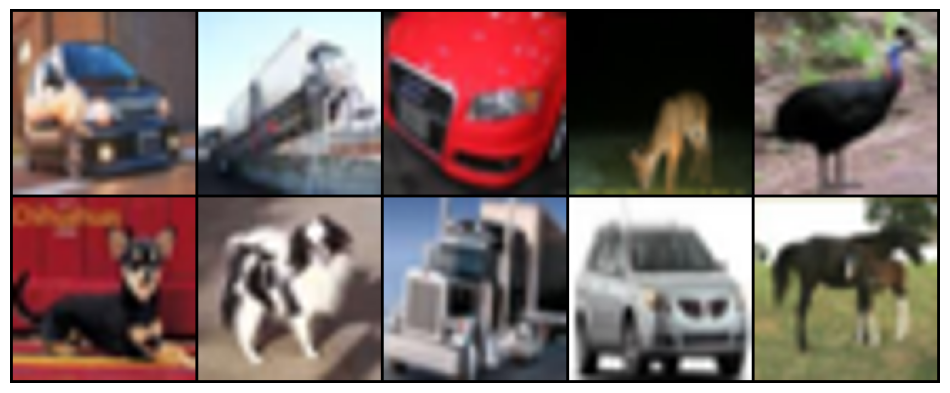

In [8]:
# 3. 准备逆标准化，以便可视化
# mean = torch.tensor([0.4914, 0.4822, 0.4465]).view(3,1,1)
# std  = torch.tensor([0.2470, 0.2435, 0.2616]).view(3,1,1)
# inv_norm = transforms.Normalize((-mean/std).squeeze(), (1/std).squeeze())

indices = random.sample(range(len(trainset)), 10)
imgs = []
for idx in indices:
    img, _ = trainset[idx]      # 返回 (C,H,W) tensor
    # img = inv_norm(img)        # 逆归一化到 [0,1]
    # img = torch.clamp(img, 0, 1)
    imgs.append(img)

grid = make_grid(imgs, nrow=5, padding=2)
plt.figure(figsize=(12, 6))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')
plt.show()

## Formal Training

In [9]:
# --- 4. Extract descriptors from training set ---
def extract_descriptors(trainset, kp_num, method=INTEREST_METHOD):
    """
    Extracts SIFT-like descriptors from the training set.
    Returns a list of descriptors and their corresponding labels.
    """
    all_desc = []
    img_desc_idx = []
    train_labels = []
    print('Extracting training descriptors...')
    for img, label in tqdm(trainset, desc='Train images'):
        img_np = (img.numpy().transpose(1,2,0) * 255).astype(np.uint8)
        gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
        kps = detect_interest_points(gray, max_kp=kp_num, method=INTEREST_METHOD)
        des = compute_custom_sift_descriptor(gray, kps)
        if des is not None:
            all_desc.extend(des)
        img_desc_idx.append(len(all_desc))
        train_labels.append(label)
    all_desc = np.vstack(all_desc)
    return all_desc, img_desc_idx, train_labels
# all_desc = []
# img_desc_idx = []
# train_labels = []
# print('Extracting training descriptors...')
# for img, label in tqdm(trainset, desc='Train images'):
#     img_np = (img.numpy().transpose(1,2,0) * 255).astype(np.uint8)
#     gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
#     kps = detect_interest_points(gray, method=INTEREST_METHOD)
#     des = compute_custom_sift_descriptor(gray, kps)
#     if des is not None:
#         all_desc.extend(des)
#     img_desc_idx.append(len(all_desc))
#     train_labels.append(label)
# all_desc = np.vstack(all_desc)

In [10]:

# --- 5. Build visual vocabulary ---
# kmeans = MiniBatchKMeans(n_clusters=N_CLUSTERS, batch_size=1000, verbose=1)
# kmeans.fit(all_desc)
def compute_kmeans(n_clusters, all_desc):
    kmeans = MiniBatchKMeans(n_clusters=n_clusters, batch_size=1000, verbose=1)
    kmeans.fit(all_desc)
    return kmeans

In [11]:
# --- 6. Build BoVW features for train ---
# def build_bovw(descriptors):
#     words = kmeans.predict(descriptors)
#     hist, _ = np.histogram(words, bins=np.arange(N_CLUSTERS+1))
#     return hist.astype(float) / (hist.sum() + 1e-7)

# train_feats = []
# start = 0
# # for idx in img_desc_idx:
# for idx in tqdm(img_desc_idx, desc='Building BoVW features'):
#     end = idx
#     if end - start > 0:
#         train_feats.append(build_bovw(all_desc[start:end]))
#     else:
#         train_feats.append(np.zeros(N_CLUSTERS, dtype=float))
#     start = end
# train_feats = np.array(train_feats)
# train_labels = np.array(train_labels)


def build_bovw(kmeans, descriptors, n_clusters):
    words = kmeans.predict(descriptors)
    hist, _ = np.histogram(words, bins=np.arange(n_clusters+1))
    return hist.astype(float) / (hist.sum() + 1e-7)

def build_bovw_features(kmeans, all_desc, img_desc_idx, train_labels, n_clusters):
    train_feats = []
    start = 0
    for idx in tqdm(img_desc_idx, desc='Building BoVW features'):
        end = idx
        if end - start > 0:
            train_feats.append(build_bovw(kmeans, all_desc[start:end], n_clusters))
        else:
            train_feats.append(np.zeros(n_clusters, dtype=float))
        start = end
    return np.array(train_feats), np.array(train_labels)

In [17]:
# --- 7. Extract BoVW features for test set ---
# test_feats = []
# test_labels = []
# print('Extracting test BoVW features...')
# for img, label in tqdm(testset, desc='Test images'):
#     img_np = (img.numpy().transpose(1,2,0) * 255).astype(np.uint8)
#     gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
#     kps = detect_interest_points(gray, method=INTEREST_METHOD)
#     des = compute_custom_sift_descriptor(gray, kps)
#     if des is not None:
#         hist = build_bovw(des)
#     else:
#         hist = np.zeros(N_CLUSTERS, dtype=float)
#     test_feats.append(hist)
#     test_labels.append(label)

# test_feats = np.array(test_feats)
# test_labels = np.array(test_labels)

def build_bovw_features_test(kmeans, testset, n_clusters, kp_num):
    test_feats = []
    test_labels = []
    print('Extracting test BoVW features...')
    for img, label in tqdm(testset, desc='Test images'):
        img_np = (img.numpy().transpose(1,2,0) * 255).astype(np.uint8)
        gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
        kps = detect_interest_points(gray, max_kp=kp_num, method=INTEREST_METHOD)
        des = compute_custom_sift_descriptor(gray, kps)
        if des is not None:
            hist = build_bovw(kmeans, des, n_clusters)
        else:
            hist = np.zeros(n_clusters, dtype=float)
        test_feats.append(hist)
        test_labels.append(label)

    return np.array(test_feats), np.array(test_labels)

## Softmax

In [25]:
# # --- 8. Train Softmax Regression (Logistic Regression) on MPS ---
# # Prepare PyTorch tensors
# X_train = torch.from_numpy(train_feats).float().to(device)
# y_train = torch.from_numpy(train_labels).long().to(device)
# X_test  = torch.from_numpy(test_feats).float().to(device)
# y_test  = torch.from_numpy(test_labels).long().to(device)

# # Define simple linear model
# # model = nn.Linear(N_CLUSTERS, 10).to(device)
# # 在定义模型时
# model = nn.Sequential(
#     nn.BatchNorm1d(N_CLUSTERS),
#     nn.Linear(N_CLUSTERS, 10)
# ).to(device)
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=LR, weight_decay=1e-4)

# print('Training Softmax Regression...')
# for ep in range(1, EPOCHS+1):
#     model.train()
#     optimizer.zero_grad()
#     outputs = model(X_train)
#     loss = criterion(outputs, y_train)
#     loss.backward()
#     optimizer.step()
#     if ep % 5 == 0:
#         print(f'Epoch {ep}/{EPOCHS}, loss={loss.item():.4f}')

In [13]:
from torch.utils.data import TensorDataset, DataLoader, random_split

# # 1) 准备 TensorDataset 并分出训练/验证集
# full_ds = TensorDataset(
#     torch.from_numpy(train_feats).float(),
#     torch.from_numpy(train_labels).long()
# )
# train_n = int(0.9 * len(full_ds))
# val_n   = len(full_ds) - train_n
# train_ds, val_ds = random_split(full_ds, [train_n, val_n])

# # 2) DataLoader
# batch_size = 256
# train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
# val_loader   = DataLoader(val_ds,   batch_size=batch_size)

# # 3) 定义模型/损失/优化
# model = nn.Sequential(
#     nn.BatchNorm1d(N_CLUSTERS),
#     nn.Linear(N_CLUSTERS, 10)
# ).to(device)
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=LR, weight_decay=1e-4)

# # 4) 训练＋验证＋保存最优模型
# best_val_acc = 0.0
# best_path    = 'best_model.pt'

# print("Start training with validation, saving best model to", best_path)
# for ep in range(1, EPOCHS+1):
#     # ---- 训练 ----
#     model.train()
#     train_loss = 0.0
#     for Xb, yb in train_loader:
#         Xb, yb = Xb.to(device), yb.to(device)
#         optimizer.zero_grad()
#         out = model(Xb)
#         loss = criterion(out, yb)
#         loss.backward()
#         optimizer.step()
#         train_loss += loss.item() * Xb.size(0)
#     train_loss /= train_n

#     # ---- 验证 ----
#     model.eval()
#     val_loss = 0.0
#     correct  = 0
#     with torch.no_grad():
#         for Xb, yb in val_loader:
#             Xb, yb = Xb.to(device), yb.to(device)
#             out = model(Xb)
#             val_loss += criterion(out, yb).item() * Xb.size(0)
#             preds = out.argmax(dim=1)
#             correct += (preds == yb).sum().item()
#     val_loss /= val_n
#     val_acc  = correct / val_n

#     # ---- 保存最优模型 ----
#     if val_acc > best_val_acc:
#         best_val_acc = val_acc
#         torch.save(model.state_dict(), best_path)
#         print(f"Epoch {ep}: New best val_acc = {val_acc:.4f}, saved to {best_path}")

#     # ---- 日志打印 ----
#     if ep == 1 or ep % 5 == 0:
#         print(f"Epoch {ep}/{EPOCHS} | "
#               f"Train Loss: {train_loss:.4f} | "
#               f"Val Loss: {val_loss:.4f} | "
#               f"Val Acc:  {val_acc:.4f}")
        


In [27]:
# # --- 9. Evaluate on test set ---
# model.eval()
# with torch.no_grad():
#     preds = model(X_test).argmax(dim=1)
#     acc = (preds == y_test).float().mean().item()
# print(f'Test Accuracy: {acc:.4f}')
# # Convert MPS tensor to CPU numpy for classification_report
# preds_np = preds.cpu().numpy()
# print(classification_report(test_labels, preds_np))

In [14]:
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import classification_report

# test_feats, test_labels = build_bovw_features_test(kmeans, testset)

# # 1. 加载验证阶段保存的最优模型权重
# model.load_state_dict(torch.load(best_path, map_location=device))
# model.eval()

# # 2. 构造测试集的 DataLoader
# test_ds    = TensorDataset(
#     torch.from_numpy(test_feats).float(),
#     torch.from_numpy(test_labels).long()
# )
# test_loader = DataLoader(test_ds, batch_size=256, shuffle=False)

# # 3. 分批推理，收集所有预测
# all_preds = []
# with torch.no_grad():
#     for Xb, _ in test_loader:
#         Xb = Xb.to(device)
#         outs = model(Xb)    
#         preds = outs.argmax(dim=1).cpu()
#         all_preds.append(preds)
# # 合并为一个一维数组
# all_preds = torch.cat(all_preds).numpy()

# # 4. 计算整体准确率
# acc = (all_preds == test_labels).mean()
# print(f"Test Accuracy: {acc:.4f}")

# classes = [
#     'plane', 'car', 'bird', 'cat', 'deer',
#     'dog', 'frog', 'horse', 'ship', 'truck'
# ]

# # 5. 打印分类报告
# print(classification_report(test_labels, all_preds, target_names=classes))
# 只用DoG只能达到 .37

---

## Grid Search Implementation

change the previous functions to direct code in cell, then avoid running in GS

In [15]:
def train_test(train_set, testset, kp_num, n_clusters):
    all_desc, img_desc_idx, train_labels = extract_descriptors(train_set, kp_num, method=INTEREST_METHOD)
    kmeans = compute_kmeans(n_clusters, all_desc)
    train_feats, train_labels = build_bovw_features(kmeans, all_desc, img_desc_idx, train_labels, n_clusters)
    test_feats, test_labels = build_bovw_features_test(kmeans, testset, n_clusters, kp_num)
    
    # 1) 准备 TensorDataset 并分出训练/验证集
    full_ds = TensorDataset(
        torch.from_numpy(train_feats).float(),
        torch.from_numpy(train_labels).long()
    )
    train_n = int(0.9 * len(full_ds))
    val_n   = len(full_ds) - train_n
    train_ds, val_ds = random_split(full_ds, [train_n, val_n])

    # 2) DataLoader
    batch_size = 256
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader   = DataLoader(val_ds,   batch_size=batch_size)

    # 3) 定义模型/损失/优化
    model = nn.Sequential(
        nn.BatchNorm1d(n_clusters),
        nn.Linear(n_clusters, 10)
    ).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LR, weight_decay=1e-4)

    # 4) 训练＋验证＋保存最优模型
    best_val_acc = 0.0
    best_path    = 'best_model.pt'

    print("Start training with validation, saving best model to", best_path)
    for ep in range(1, EPOCHS+1):
        # ---- 训练 ----
        model.train()
        train_loss = 0.0
        for Xb, yb in train_loader:
            Xb, yb = Xb.to(device), yb.to(device)
            optimizer.zero_grad()
            out = model(Xb)
            loss = criterion(out, yb)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * Xb.size(0)
        train_loss /= train_n

        # ---- 验证 ----
        model.eval()
        val_loss = 0.0
        correct  = 0
        with torch.no_grad():
            for Xb, yb in val_loader:
                Xb, yb = Xb.to(device), yb.to(device)
                out = model(Xb)
                val_loss += criterion(out, yb).item() * Xb.size(0)
                preds = out.argmax(dim=1)
                correct += (preds == yb).sum().item()
        val_loss /= val_n
        val_acc  = correct / val_n

        # ---- 保存最优模型 ----
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model.state_dict(), best_path)
            print(f"Epoch {ep}: New best val_acc = {val_acc:.4f}, saved to {best_path}")

        # ---- 日志打印 ----
        if ep == 1 or ep % 5 == 0:
            print(f"Epoch {ep}/{EPOCHS} | "
                f"Train Loss: {train_loss:.4f} | "
                f"Val Loss: {val_loss:.4f} | "
                f"Val Acc:  {val_acc:.4f}")
        
    
    # --- 9. Evaluate on test set ---
    # 1. 加载验证阶段保存的最优模型权重
    model.load_state_dict(torch.load(best_path, map_location=device))
    model.eval()

    # 2. 构造测试集的 DataLoader
    test_ds    = TensorDataset(
        torch.from_numpy(test_feats).float(),
        torch.from_numpy(test_labels).long()
    )
    test_loader = DataLoader(test_ds, batch_size=256, shuffle=False)

    # 3. 分批推理，收集所有预测
    all_preds = []
    with torch.no_grad():
        for Xb, _ in test_loader:
            Xb = Xb.to(device)
            outs = model(Xb)    
            preds = outs.argmax(dim=1).cpu()
            all_preds.append(preds)
    # 合并为一个一维数组
    all_preds = torch.cat(all_preds).numpy()

    # 4. 计算整体准确率
    acc = (all_preds == test_labels).mean()
    print(f"Test Accuracy: {acc:.4f}")

    classes = [
        'plane', 'car', 'bird', 'cat', 'deer',
        'dog', 'frog', 'horse', 'ship', 'truck'
    ]

    # 5. 打印分类报告
    print(classification_report(test_labels, all_preds, target_names=classes))

    return acc

In [ ]:
kp_nums = [50, 100, 200, 500, 1000]
n_clusterses = [100, 500, 1000, 2000, 5000]

results = []
for kp_num in kp_nums:
    for n_clusters in n_clusterses:
        print(f"Training with kp_num={kp_num}, n_clusters={n_clusters}")
        acc = train_test(trainset, testset, kp_num, n_clusters)
        results.append({'n_clusters': n_clusters,
                        'kp_num': kp_num,
                        'acc': acc})
        print(f"Accuracy: {acc:.4f}")




Test images: 100%|██████████| 3000/3000 [02:57<00:00, 16.87it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.2658, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.1769 | Val Loss: 2.2594 | Val Acc:  0.2658
Epoch 2: New best val_acc = 0.2933, saved to best_model.pt
Epoch 3: New best val_acc = 0.2958, saved to best_model.pt
Epoch 5: New best val_acc = 0.2983, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.5449 | Val Loss: 2.0351 | Val Acc:  0.2983
Epoch 10/50 | Train Loss: 1.4371 | Val Loss: 2.2874 | Val Acc:  0.2708
Epoch 15/50 | Train Loss: 1.4214 | Val Loss: 2.5122 | Val Acc:  0.2633
Epoch 20/50 | Train Loss: 1.4310 | Val Loss: 2.6697 | Val Acc:  0.2550
Epoch 25/50 | Train Loss: 1.4469 | Val Loss: 2.7730 | Val Acc:  0.2433
Epoch 30/50 | Train Loss: 1.4585 | Val Loss: 2.8187 | Val Acc:  0.2517
Epoch 35/50 | Train Loss: 1.4623 | Val Loss: 2.8455 | Val Acc:  0.2475
Epoch 40/50 | Train Loss: 1.4845 | Val Loss: 2.8490 | Val Acc:  0.2458
Epoch 45/50 | Train Loss: 1.4937 | Val Loss: 2.8507 | Val Ac

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.4958 | Val Loss: 2.8305 | Val Acc:  0.2508
Test Accuracy: 0.3080
              precision    recall  f1-score   support

       plane       0.31      0.27      0.29       297
         car       0.32      0.28      0.30       307
        bird       0.26      0.23      0.24       310
         cat       0.24      0.18      0.21       319
        deer       0.21      0.17      0.19       287
         dog       0.31      0.35      0.32       304
        frog       0.34      0.46      0.39       285
       horse       0.34      0.34      0.34       299
        ship       0.32      0.42      0.37       293
       truck       0.36      0.40      0.38       299

    accuracy                           0.31      3000
   macro avg       0.30      0.31      0.30      3000
weighted avg       0.30      0.31      0.30      3000

Accuracy: 0.3080
Training with kp_num=50, n_clusters=2000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [11:45<00:00, 17.01it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1245.971435546875
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/48025: mean batch inertia: 0.4061439208984375
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 2/48025: mean batch inertia: 0.4022934265136719, ewa inertia: 0.4022934265136719
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 3/48025: mean batch inertia: 0.3916866149902344, ewa inertia: 0.4022492552077345
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 4/48025: mean batch inertia: 0.3782779541015625, ewa inertia: 0.40214942844334467
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 5/48025: mean batch inertia: 0.3575270080566406, ewa inertia: 0.40196360157367583
[MiniBatchKMeans] Reassigning 471 cluster centers.
Minibatch step 6/48025: mean batch inertia: 0.3580107116699219, ewa inertia: 0.40178056291568887
Minibatch step 7/48025: mean batch inertia: 0.34134002685546877, ewa inertia:

Building BoVW features: 100%|██████████| 12000/12000 [00:03<00:00, 3489.47it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [02:56<00:00, 16.96it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.2442, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.1384 | Val Loss: 2.2681 | Val Acc:  0.2442
Epoch 2: New best val_acc = 0.2933, saved to best_model.pt
Epoch 3: New best val_acc = 0.3000, saved to best_model.pt
Epoch 4: New best val_acc = 0.3067, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.3000 | Val Loss: 2.1034 | Val Acc:  0.3058
Epoch 10/50 | Train Loss: 1.0852 | Val Loss: 2.3679 | Val Acc:  0.2792
Epoch 15/50 | Train Loss: 0.9926 | Val Loss: 2.6075 | Val Acc:  0.2725
Epoch 20/50 | Train Loss: 0.9332 | Val Loss: 2.7993 | Val Acc:  0.2650
Epoch 25/50 | Train Loss: 0.8906 | Val Loss: 2.9835 | Val Acc:  0.2600
Epoch 30/50 | Train Loss: 0.8652 | Val Loss: 3.1565 | Val Acc:  0.2667
Epoch 35/50 | Train Loss: 0.8396 | Val Loss: 3.3157 | Val Acc:  0.2658
Epoch 40/50 | Train Loss: 0.8294 | Val Loss: 3.4673 | Val Acc:  0.2583
Epoch 45/50 | Train Loss: 0.8184 | Val Loss: 3.5865 | Val Ac

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 0.8061 | Val Loss: 3.7280 | Val Acc:  0.2617
Test Accuracy: 0.3050
              precision    recall  f1-score   support

       plane       0.30      0.27      0.28       297
         car       0.30      0.28      0.29       307
        bird       0.32      0.25      0.28       310
         cat       0.23      0.19      0.21       319
        deer       0.22      0.19      0.21       287
         dog       0.30      0.35      0.32       304
        frog       0.33      0.47      0.39       285
       horse       0.34      0.32      0.33       299
        ship       0.34      0.38      0.36       293
       truck       0.34      0.37      0.35       299

    accuracy                           0.30      3000
   macro avg       0.30      0.31      0.30      3000
weighted avg       0.30      0.30      0.30      3000

Accuracy: 0.3050
Training with kp_num=50, n_clusters=5000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [11:45<00:00, 17.01it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 5202.70263671875
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/48025: mean batch inertia: 0.349828369140625
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 2/48025: mean batch inertia: 0.3613360595703125, ewa inertia: 0.3613360595703125
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 3/48025: mean batch inertia: 0.3608043518066406, ewa inertia: 0.36133384531146134
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 4/48025: mean batch inertia: 0.3466396484375, ewa inertia: 0.36127265238235257
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 5/48025: mean batch inertia: 0.3488021240234375, ewa inertia: 0.36122071976130754
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 6/48025: mean batch inertia: 0.34390997314453126, ewa inertia: 0.3611486303984368
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 7/48025: mean b

Building BoVW features: 100%|██████████| 12000/12000 [00:06<00:00, 1736.27it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [02:58<00:00, 16.80it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.1817, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.1008 | Val Loss: 2.2736 | Val Acc:  0.1817
Epoch 2: New best val_acc = 0.2975, saved to best_model.pt
Epoch 5/50 | Train Loss: 0.9105 | Val Loss: 2.2528 | Val Acc:  0.2758
Epoch 10/50 | Train Loss: 0.7321 | Val Loss: 2.5419 | Val Acc:  0.2775
Epoch 15/50 | Train Loss: 0.8438 | Val Loss: 2.6835 | Val Acc:  0.2475
Epoch 20/50 | Train Loss: 1.0197 | Val Loss: 3.1627 | Val Acc:  0.2092
Epoch 25/50 | Train Loss: 1.4140 | Val Loss: 3.0067 | Val Acc:  0.2217
Epoch 30/50 | Train Loss: 1.7250 | Val Loss: 3.6051 | Val Acc:  0.1717
Epoch 35/50 | Train Loss: 2.1875 | Val Loss: 3.6458 | Val Acc:  0.1775
Epoch 40/50 | Train Loss: 2.5577 | Val Loss: 4.0344 | Val Acc:  0.1800
Epoch 45/50 | Train Loss: 2.5659 | Val Loss: 4.3711 | Val Acc:  0.1758


/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 2.6211 | Val Loss: 4.4209 | Val Acc:  0.1725
Test Accuracy: 0.3080
              precision    recall  f1-score   support

       plane       0.28      0.36      0.31       297
         car       0.35      0.22      0.27       307
        bird       0.29      0.20      0.24       310
         cat       0.27      0.12      0.17       319
        deer       0.22      0.16      0.18       287
         dog       0.25      0.45      0.32       304
        frog       0.36      0.42      0.39       285
       horse       0.30      0.36      0.33       299
        ship       0.36      0.42      0.39       293
       truck       0.42      0.39      0.40       299

    accuracy                           0.31      3000
   macro avg       0.31      0.31      0.30      3000
weighted avg       0.31      0.31      0.30      3000

Accuracy: 0.3080
Training with kp_num=100, n_clusters=100
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [15:33<00:00, 12.86it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1953.236083984375
Minibatch step 1/94612: mean batch inertia: 0.6491550903320312
Minibatch step 2/94612: mean batch inertia: 0.48267938232421875, ewa inertia: 0.48267938232421875
Minibatch step 3/94612: mean batch inertia: 0.4601177978515625, ewa inertia: 0.4826316895143717
Minibatch step 4/94612: mean batch inertia: 0.465432861328125, ewa inertia: 0.48259533300566665
[MiniBatchKMeans] Reassigning 1 cluster centers.
Minibatch step 5/94612: mean batch inertia: 0.45494000244140625, ewa inertia: 0.48253687255385497
Minibatch step 6/94612: mean batch inertia: 0.449205322265625, ewa inertia: 0.48246641317225736
Minibatch step 7/94612: mean batch inertia: 0.4486014404296875, ewa inertia: 0.4823948261918551
Minibatch step 8/94612: mean batch inertia: 0.4432850036621094, ewa inertia: 0.48231215215221374
Minibatch step 9/94612: mean batch inertia: 0.44280755615234374, ewa inertia: 0.4822286436030961
Minibatch step 10/94612: mean batch inertia

Building BoVW features: 100%|██████████| 12000/12000 [00:01<00:00, 8607.70it/s] 


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [04:00<00:00, 12.47it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.2192, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.2866 | Val Loss: 2.2442 | Val Acc:  0.2192
Epoch 2: New best val_acc = 0.2708, saved to best_model.pt
Epoch 3: New best val_acc = 0.2975, saved to best_model.pt
Epoch 4: New best val_acc = 0.3150, saved to best_model.pt
Epoch 5: New best val_acc = 0.3250, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.9139 | Val Loss: 1.9034 | Val Acc:  0.3250
Epoch 6: New best val_acc = 0.3317, saved to best_model.pt
Epoch 7: New best val_acc = 0.3342, saved to best_model.pt
Epoch 8: New best val_acc = 0.3400, saved to best_model.pt
Epoch 9: New best val_acc = 0.3467, saved to best_model.pt
Epoch 10: New best val_acc = 0.3475, saved to best_model.pt
Epoch 10/50 | Train Loss: 1.8557 | Val Loss: 1.8599 | Val Acc:  0.3475
Epoch 15/50 | Train Loss: 1.8430 | Val Loss: 1.8596 | Val Acc:  0.3433
Epoch 20/50 | Train Loss: 1.8405 | Val Loss: 1.8579 | Val Ac

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.8396 | Val Loss: 1.8618 | Val Acc:  0.3392
Test Accuracy: 0.3220
              precision    recall  f1-score   support

       plane       0.32      0.28      0.30       297
         car       0.28      0.23      0.26       307
        bird       0.26      0.21      0.23       310
         cat       0.29      0.16      0.21       319
        deer       0.30      0.24      0.27       287
         dog       0.31      0.40      0.35       304
        frog       0.32      0.50      0.39       285
       horse       0.38      0.34      0.36       299
        ship       0.36      0.43      0.39       293
       truck       0.36      0.44      0.40       299

    accuracy                           0.32      3000
   macro avg       0.32      0.32      0.32      3000
weighted avg       0.32      0.32      0.31      3000

Accuracy: 0.3220
Training with kp_num=100, n_clusters=500
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [15:59<00:00, 12.51it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1524.1873779296875
[MiniBatchKMeans] Reassigning 131 cluster centers.
Minibatch step 1/94612: mean batch inertia: 0.5126823120117188
Minibatch step 2/94612: mean batch inertia: 0.4530410461425781, ewa inertia: 0.4530410461425781
Minibatch step 3/94612: mean batch inertia: 0.43126693725585935, ewa inertia: 0.4529950179730592
Minibatch step 4/94612: mean batch inertia: 0.4198162841796875, ewa inertia: 0.45292488162941313
Minibatch step 5/94612: mean batch inertia: 0.40396719360351563, ewa inertia: 0.4528213902408362
Minibatch step 6/94612: mean batch inertia: 0.39886370849609376, ewa inertia: 0.45270732939292185
Minibatch step 7/94612: mean batch inertia: 0.3936882019042969, ewa inertia: 0.4525825691825711
Minibatch step 8/94612: mean batch inertia: 0.39073126220703125, ewa inertia: 0.4524518220435148
Minibatch step 9/94612: mean batch inertia: 0.3769793701171875, ewa inertia: 0.45229228124074994
Minibatch step 10/94612: mean batch ine

Building BoVW features: 100%|██████████| 12000/12000 [00:02<00:00, 4185.15it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [04:01<00:00, 12.42it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.2658, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.1732 | Val Loss: 2.2504 | Val Acc:  0.2658
Epoch 2: New best val_acc = 0.3092, saved to best_model.pt
Epoch 3: New best val_acc = 0.3300, saved to best_model.pt
Epoch 4: New best val_acc = 0.3317, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.6405 | Val Loss: 1.8676 | Val Acc:  0.3267
Epoch 6: New best val_acc = 0.3383, saved to best_model.pt
Epoch 7: New best val_acc = 0.3400, saved to best_model.pt
Epoch 10/50 | Train Loss: 1.5676 | Val Loss: 1.9442 | Val Acc:  0.3283
Epoch 15/50 | Train Loss: 1.5578 | Val Loss: 2.0242 | Val Acc:  0.3192
Epoch 20/50 | Train Loss: 1.5649 | Val Loss: 2.0471 | Val Acc:  0.3175
Epoch 25/50 | Train Loss: 1.5747 | Val Loss: 2.0649 | Val Acc:  0.3108
Epoch 30/50 | Train Loss: 1.5772 | Val Loss: 2.0570 | Val Acc:  0.3217
Epoch 35/50 | Train Loss: 1.5814 | Val Loss: 2.0525 | Val Acc:  0.3192
Epoch 40/50 |

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.5979 | Val Loss: 2.0528 | Val Acc:  0.3100
Test Accuracy: 0.3373
              precision    recall  f1-score   support

       plane       0.32      0.29      0.31       297
         car       0.33      0.30      0.31       307
        bird       0.27      0.22      0.24       310
         cat       0.28      0.20      0.23       319
        deer       0.28      0.22      0.25       287
         dog       0.34      0.38      0.36       304
        frog       0.36      0.47      0.41       285
       horse       0.39      0.39      0.39       299
        ship       0.34      0.43      0.38       293
       truck       0.40      0.48      0.44       299

    accuracy                           0.34      3000
   macro avg       0.33      0.34      0.33      3000
weighted avg       0.33      0.34      0.33      3000

Accuracy: 0.3373
Training with kp_num=100, n_clusters=1000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [15:44<00:00, 12.71it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1432.072998046875
[MiniBatchKMeans] Reassigning 488 cluster centers.
Minibatch step 1/94612: mean batch inertia: 0.4735231323242188
Minibatch step 2/94612: mean batch inertia: 0.4501285400390625, ewa inertia: 0.4501285400390625
Minibatch step 3/94612: mean batch inertia: 0.4102908020019531, ewa inertia: 0.4500443272628169
Minibatch step 4/94612: mean batch inertia: 0.3957458190917969, ewa inertia: 0.4499295459437868
Minibatch step 5/94612: mean batch inertia: 0.39264837646484374, ewa inertia: 0.4498084595933539
Minibatch step 6/94612: mean batch inertia: 0.38477914428710935, ewa inertia: 0.4496709944798933
Minibatch step 7/94612: mean batch inertia: 0.3782298583984375, ewa inertia: 0.4495199754536134
Minibatch step 8/94612: mean batch inertia: 0.3781989440917969, ewa inertia: 0.44936921031604254
Minibatch step 9/94612: mean batch inertia: 0.35867431640625, ewa inertia: 0.4491774908765421
Minibatch step 10/94612: mean batch inertia: 0

Building BoVW features: 100%|██████████| 12000/12000 [00:03<00:00, 3348.52it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [03:55<00:00, 12.74it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3150, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.1085 | Val Loss: 2.2533 | Val Acc:  0.3150
Epoch 2: New best val_acc = 0.3725, saved to best_model.pt
Epoch 3: New best val_acc = 0.3800, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.4513 | Val Loss: 1.8604 | Val Acc:  0.3742
Epoch 10/50 | Train Loss: 1.3193 | Val Loss: 2.0609 | Val Acc:  0.3500
Epoch 15/50 | Train Loss: 1.2930 | Val Loss: 2.2581 | Val Acc:  0.3450
Epoch 20/50 | Train Loss: 1.2938 | Val Loss: 2.4240 | Val Acc:  0.3283
Epoch 25/50 | Train Loss: 1.3031 | Val Loss: 2.5549 | Val Acc:  0.3258
Epoch 30/50 | Train Loss: 1.3205 | Val Loss: 2.6353 | Val Acc:  0.3200
Epoch 35/50 | Train Loss: 1.3283 | Val Loss: 2.7099 | Val Acc:  0.3108
Epoch 40/50 | Train Loss: 1.3465 | Val Loss: 2.7373 | Val Acc:  0.3000
Epoch 45/50 | Train Loss: 1.3503 | Val Loss: 2.7278 | Val Acc:  0.3083


/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.3574 | Val Loss: 2.6973 | Val Acc:  0.3192
Test Accuracy: 0.3350
              precision    recall  f1-score   support

       plane       0.32      0.28      0.30       297
         car       0.35      0.31      0.33       307
        bird       0.31      0.24      0.27       310
         cat       0.26      0.17      0.20       319
        deer       0.29      0.23      0.26       287
         dog       0.29      0.33      0.31       304
        frog       0.35      0.56      0.43       285
       horse       0.40      0.34      0.37       299
        ship       0.32      0.41      0.36       293
       truck       0.42      0.49      0.45       299

    accuracy                           0.34      3000
   macro avg       0.33      0.34      0.33      3000
weighted avg       0.33      0.34      0.33      3000

Accuracy: 0.3350
Training with kp_num=100, n_clusters=2000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [15:42<00:00, 12.74it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1283.126220703125
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/94612: mean batch inertia: 0.4259501037597656
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 2/94612: mean batch inertia: 0.42547735595703123, ewa inertia: 0.42547735595703123
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 3/94612: mean batch inertia: 0.3964412841796875, ewa inertia: 0.4254159767639315
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 4/94612: mean batch inertia: 0.40180047607421876, ewa inertia: 0.4253660560863655
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 5/94612: mean batch inertia: 0.3759339599609375, ewa inertia: 0.4252615618491053
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 6/94612: mean batch inertia: 0.365085693359375, ewa inertia: 0.4251343564102878
[MiniBatchKMeans] Reassigning 441 cluster centers.
Minibatch step 7/94612: mea

Building BoVW features: 100%|██████████| 12000/12000 [00:06<00:00, 1974.85it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [03:57<00:00, 12.62it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.2958, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.0546 | Val Loss: 2.2620 | Val Acc:  0.2958
Epoch 2: New best val_acc = 0.3550, saved to best_model.pt
Epoch 3: New best val_acc = 0.3567, saved to best_model.pt
Epoch 4: New best val_acc = 0.3575, saved to best_model.pt
Epoch 5: New best val_acc = 0.3592, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.1876 | Val Loss: 1.9217 | Val Acc:  0.3592
Epoch 6: New best val_acc = 0.3633, saved to best_model.pt
Epoch 10/50 | Train Loss: 0.9310 | Val Loss: 2.2798 | Val Acc:  0.3417
Epoch 15/50 | Train Loss: 0.8073 | Val Loss: 2.7110 | Val Acc:  0.3125
Epoch 20/50 | Train Loss: 0.7362 | Val Loss: 3.1788 | Val Acc:  0.2967
Epoch 25/50 | Train Loss: 0.6885 | Val Loss: 3.6342 | Val Acc:  0.2883
Epoch 30/50 | Train Loss: 0.6446 | Val Loss: 4.1242 | Val Acc:  0.2892
Epoch 35/50 | Train Loss: 0.6214 | Val Loss: 4.6094 | Val Acc:  0.2858
Epoch 40/50 |

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 0.5765 | Val Loss: 6.0867 | Val Acc:  0.2767
Test Accuracy: 0.3513
              precision    recall  f1-score   support

       plane       0.34      0.32      0.33       297
         car       0.34      0.33      0.33       307
        bird       0.35      0.29      0.32       310
         cat       0.25      0.21      0.23       319
        deer       0.29      0.24      0.26       287
         dog       0.31      0.36      0.33       304
        frog       0.41      0.52      0.46       285
       horse       0.38      0.35      0.36       299
        ship       0.37      0.45      0.41       293
       truck       0.42      0.46      0.44       299

    accuracy                           0.35      3000
   macro avg       0.35      0.35      0.35      3000
weighted avg       0.35      0.35      0.35      3000

Accuracy: 0.3513
Training with kp_num=100, n_clusters=5000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [15:39<00:00, 12.77it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 5541.90576171875
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/94612: mean batch inertia: 0.361532470703125
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 2/94612: mean batch inertia: 0.376639892578125, ewa inertia: 0.376639892578125
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 3/94612: mean batch inertia: 0.37560531616210935, ewa inertia: 0.37663770559270554
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 4/94612: mean batch inertia: 0.3637804870605469, ewa inertia: 0.3766105267888693
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 5/94612: mean batch inertia: 0.3598830871582031, ewa inertia: 0.3765751667458501
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 6/94612: mean batch inertia: 0.3531172180175781, ewa inertia: 0.37652557911651247
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 7/94612: mean b

Building BoVW features: 100%|██████████| 12000/12000 [00:13<00:00, 900.87it/s] 


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [04:01<00:00, 12.43it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3333, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.0158 | Val Loss: 2.2681 | Val Acc:  0.3333
Epoch 2: New best val_acc = 0.3833, saved to best_model.pt
Epoch 5/50 | Train Loss: 0.7993 | Val Loss: 1.8932 | Val Acc:  0.3667
Epoch 10/50 | Train Loss: 0.4873 | Val Loss: 2.1999 | Val Acc:  0.3283
Epoch 15/50 | Train Loss: 0.3927 | Val Loss: 2.5269 | Val Acc:  0.3158
Epoch 20/50 | Train Loss: 0.3998 | Val Loss: 2.8775 | Val Acc:  0.2867
Epoch 25/50 | Train Loss: 0.4515 | Val Loss: 3.2768 | Val Acc:  0.2900
Epoch 30/50 | Train Loss: 0.5533 | Val Loss: 3.6791 | Val Acc:  0.2658
Epoch 35/50 | Train Loss: 0.6268 | Val Loss: 4.1688 | Val Acc:  0.2633
Epoch 40/50 | Train Loss: 0.6532 | Val Loss: 4.5918 | Val Acc:  0.2375
Epoch 45/50 | Train Loss: 0.6959 | Val Loss: 4.8344 | Val Acc:  0.2417


/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 0.6601 | Val Loss: 5.2716 | Val Acc:  0.2367
Test Accuracy: 0.3683
              precision    recall  f1-score   support

       plane       0.35      0.36      0.36       297
         car       0.38      0.36      0.37       307
        bird       0.41      0.29      0.34       310
         cat       0.21      0.20      0.21       319
        deer       0.34      0.20      0.25       287
         dog       0.36      0.44      0.40       304
        frog       0.42      0.49      0.45       285
       horse       0.39      0.39      0.39       299
        ship       0.38      0.42      0.40       293
       truck       0.43      0.54      0.48       299

    accuracy                           0.37      3000
   macro avg       0.37      0.37      0.36      3000
weighted avg       0.37      0.37      0.36      3000

Accuracy: 0.3683
Training with kp_num=200, n_clusters=100
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [22:54<00:00,  8.73it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1961.27099609375
Minibatch step 1/185457: mean batch inertia: 0.6663935546875
Minibatch step 2/185457: mean batch inertia: 0.4947745666503906, ewa inertia: 0.4947745666503906
Minibatch step 3/185457: mean batch inertia: 0.47459027099609374, ewa inertia: 0.4947527996781874
Minibatch step 4/185457: mean batch inertia: 0.46953262329101564, ewa inertia: 0.4947256019553745
[MiniBatchKMeans] Reassigning 1 cluster centers.
Minibatch step 5/185457: mean batch inertia: 0.463713134765625, ewa inertia: 0.49469215776079706
Minibatch step 6/185457: mean batch inertia: 0.46233065795898437, ewa inertia: 0.49465725875422756
Minibatch step 7/185457: mean batch inertia: 0.445600830078125, ewa inertia: 0.4946043557479662
Minibatch step 8/185457: mean batch inertia: 0.45550164794921877, ewa inertia: 0.4945621869466217
Minibatch step 9/185457: mean batch inertia: 0.45543484497070313, ewa inertia: 0.49451999157950255
Minibatch step 10/185457: mean batch i

Building BoVW features: 100%|██████████| 12000/12000 [00:02<00:00, 4403.96it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [05:50<00:00,  8.56it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.1833, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.2899 | Val Loss: 2.2482 | Val Acc:  0.1833
Epoch 2: New best val_acc = 0.2733, saved to best_model.pt
Epoch 3: New best val_acc = 0.3042, saved to best_model.pt
Epoch 4: New best val_acc = 0.3208, saved to best_model.pt
Epoch 5: New best val_acc = 0.3400, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.8280 | Val Loss: 1.8607 | Val Acc:  0.3400
Epoch 6: New best val_acc = 0.3425, saved to best_model.pt
Epoch 7: New best val_acc = 0.3450, saved to best_model.pt
Epoch 9: New best val_acc = 0.3458, saved to best_model.pt
Epoch 10/50 | Train Loss: 1.7580 | Val Loss: 1.8319 | Val Acc:  0.3442
Epoch 14: New best val_acc = 0.3500, saved to best_model.pt
Epoch 15/50 | Train Loss: 1.7423 | Val Loss: 1.8308 | Val Acc:  0.3475
Epoch 19: New best val_acc = 0.3542, saved to best_model.pt
Epoch 20/50 | Train Loss: 1.7382 | Val Loss: 1.8355 | Val A

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.7291 | Val Loss: 1.8476 | Val Acc:  0.3592
Test Accuracy: 0.3453
              precision    recall  f1-score   support

       plane       0.34      0.30      0.32       297
         car       0.32      0.28      0.30       307
        bird       0.29      0.23      0.26       310
         cat       0.23      0.15      0.18       319
        deer       0.30      0.26      0.28       287
         dog       0.34      0.46      0.39       304
        frog       0.39      0.57      0.46       285
       horse       0.38      0.32      0.35       299
        ship       0.36      0.43      0.39       293
       truck       0.42      0.48      0.45       299

    accuracy                           0.35      3000
   macro avg       0.34      0.35      0.34      3000
weighted avg       0.34      0.35      0.34      3000

Accuracy: 0.3453
Training with kp_num=200, n_clusters=500
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [23:10<00:00,  8.63it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1585.522216796875
[MiniBatchKMeans] Reassigning 136 cluster centers.
Minibatch step 1/185457: mean batch inertia: 0.5204693603515625
Minibatch step 2/185457: mean batch inertia: 0.47281976318359376, ewa inertia: 0.47281976318359376
Minibatch step 3/185457: mean batch inertia: 0.4378505859375, ewa inertia: 0.47278205202824203
Minibatch step 4/185457: mean batch inertia: 0.422303955078125, ewa inertia: 0.47272761587887113
Minibatch step 5/185457: mean batch inertia: 0.415347412109375, ewa inertia: 0.4726657364196194
Minibatch step 6/185457: mean batch inertia: 0.41958526611328123, ewa inertia: 0.4726084938414547
Minibatch step 7/185457: mean batch inertia: 0.404679443359375, ewa inertia: 0.4725352383868697
Minibatch step 8/185457: mean batch inertia: 0.40716888427734377, ewa inertia: 0.47246474657297166
Minibatch step 9/185457: mean batch inertia: 0.3917979736328125, ewa inertia: 0.4723777546147491
Minibatch step 10/185457: mean batch 

Building BoVW features: 100%|██████████| 12000/12000 [00:02<00:00, 4054.90it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [05:54<00:00,  8.45it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3133, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.0834 | Val Loss: 2.2425 | Val Acc:  0.3133
Epoch 2: New best val_acc = 0.3883, saved to best_model.pt
Epoch 3: New best val_acc = 0.4025, saved to best_model.pt
Epoch 4: New best val_acc = 0.4192, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.5398 | Val Loss: 1.6813 | Val Acc:  0.4192
Epoch 10/50 | Train Loss: 1.4529 | Val Loss: 1.7451 | Val Acc:  0.4158
Epoch 15/50 | Train Loss: 1.4379 | Val Loss: 1.8149 | Val Acc:  0.4000
Epoch 20/50 | Train Loss: 1.4429 | Val Loss: 1.8641 | Val Acc:  0.3917
Epoch 25/50 | Train Loss: 1.4464 | Val Loss: 1.8933 | Val Acc:  0.3875
Epoch 30/50 | Train Loss: 1.4529 | Val Loss: 1.8934 | Val Acc:  0.3817
Epoch 35/50 | Train Loss: 1.4577 | Val Loss: 1.9006 | Val Acc:  0.3858
Epoch 40/50 | Train Loss: 1.4633 | Val Loss: 1.8885 | Val Acc:  0.3842
Epoch 45/50 | Train Loss: 1.4709 | Val Loss: 1.8809 | Val Ac

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.4716 | Val Loss: 1.8842 | Val Acc:  0.3883
Test Accuracy: 0.3853
              precision    recall  f1-score   support

       plane       0.44      0.41      0.42       297
         car       0.36      0.36      0.36       307
        bird       0.37      0.24      0.29       310
         cat       0.30      0.19      0.24       319
        deer       0.34      0.25      0.29       287
         dog       0.35      0.40      0.37       304
        frog       0.41      0.64      0.50       285
       horse       0.39      0.39      0.39       299
        ship       0.38      0.43      0.40       293
       truck       0.45      0.58      0.50       299

    accuracy                           0.39      3000
   macro avg       0.38      0.39      0.38      3000
weighted avg       0.38      0.39      0.37      3000

Accuracy: 0.3853
Training with kp_num=200, n_clusters=1000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [23:19<00:00,  8.57it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1470.1636962890625
[MiniBatchKMeans] Reassigning 497 cluster centers.
Minibatch step 1/185457: mean batch inertia: 0.49095443725585936
Minibatch step 2/185457: mean batch inertia: 0.4722474670410156, ewa inertia: 0.4722474670410156
Minibatch step 3/185457: mean batch inertia: 0.43627630615234375, ewa inertia: 0.47220867533519684
Minibatch step 4/185457: mean batch inertia: 0.4185848388671875, ewa inertia: 0.47215084678483177
Minibatch step 5/185457: mean batch inertia: 0.41276202392578126, ewa inertia: 0.4720868012080876
Minibatch step 6/185457: mean batch inertia: 0.39868161010742187, ewa inertia: 0.4720076402216641
Minibatch step 7/185457: mean batch inertia: 0.38701165771484375, ewa inertia: 0.4719159795949919
Minibatch step 8/185457: mean batch inertia: 0.3959745788574219, ewa inertia: 0.47183408353147605
Minibatch step 9/185457: mean batch inertia: 0.3938057861328125, ewa inertia: 0.4717499369350513
Minibatch step 10/185457: mea

Building BoVW features: 100%|██████████| 12000/12000 [00:05<00:00, 2335.01it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [05:51<00:00,  8.54it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3317, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.0183 | Val Loss: 2.2530 | Val Acc:  0.3317
Epoch 2: New best val_acc = 0.3825, saved to best_model.pt
Epoch 3: New best val_acc = 0.4025, saved to best_model.pt
Epoch 4: New best val_acc = 0.4050, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.3520 | Val Loss: 1.6992 | Val Acc:  0.4050
Epoch 10/50 | Train Loss: 1.2009 | Val Loss: 1.8507 | Val Acc:  0.3750
Epoch 15/50 | Train Loss: 1.1638 | Val Loss: 2.0620 | Val Acc:  0.3608
Epoch 20/50 | Train Loss: 1.1502 | Val Loss: 2.2390 | Val Acc:  0.3492
Epoch 25/50 | Train Loss: 1.1543 | Val Loss: 2.3942 | Val Acc:  0.3500
Epoch 30/50 | Train Loss: 1.1586 | Val Loss: 2.5123 | Val Acc:  0.3367
Epoch 35/50 | Train Loss: 1.1740 | Val Loss: 2.6151 | Val Acc:  0.3375
Epoch 40/50 | Train Loss: 1.1774 | Val Loss: 2.6695 | Val Acc:  0.3425
Epoch 45/50 | Train Loss: 1.1972 | Val Loss: 2.7271 | Val Ac

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.2005 | Val Loss: 2.7386 | Val Acc:  0.3400
Test Accuracy: 0.4003
              precision    recall  f1-score   support

       plane       0.47      0.42      0.44       297
         car       0.42      0.41      0.41       307
        bird       0.38      0.28      0.32       310
         cat       0.26      0.16      0.20       319
        deer       0.33      0.30      0.31       287
         dog       0.34      0.41      0.37       304
        frog       0.44      0.63      0.52       285
       horse       0.41      0.38      0.40       299
        ship       0.42      0.45      0.43       293
       truck       0.47      0.59      0.52       299

    accuracy                           0.40      3000
   macro avg       0.39      0.40      0.39      3000
weighted avg       0.39      0.40      0.39      3000

Accuracy: 0.4003
Training with kp_num=200, n_clusters=2000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [23:17<00:00,  8.59it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1350.7490234375
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/185457: mean batch inertia: 0.4374254150390625
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 2/185457: mean batch inertia: 0.44707354736328125, ewa inertia: 0.44707354736328125
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 3/185457: mean batch inertia: 0.41684109497070315, ewa inertia: 0.44704094434546315
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 4/185457: mean batch inertia: 0.40579986572265625, ewa inertia: 0.4469964695008915
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 5/185457: mean batch inertia: 0.397250244140625, ewa inertia: 0.44694282261010193
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 6/185457: mean batch inertia: 0.3892919921875, ewa inertia: 0.44688065130401367
[MiniBatchKMeans] Reassigning 434 cluster centers.
Minibatch step 7/18545

Building BoVW features: 100%|██████████| 12000/12000 [00:08<00:00, 1336.61it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [05:45<00:00,  8.68it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3142, saved to best_model.pt
Epoch 1/50 | Train Loss: 1.9634 | Val Loss: 2.2603 | Val Acc:  0.3142
Epoch 2: New best val_acc = 0.4000, saved to best_model.pt
Epoch 3: New best val_acc = 0.4150, saved to best_model.pt
Epoch 4: New best val_acc = 0.4158, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.1234 | Val Loss: 1.6993 | Val Acc:  0.3958
Epoch 10/50 | Train Loss: 0.8571 | Val Loss: 1.9312 | Val Acc:  0.3817
Epoch 15/50 | Train Loss: 0.7194 | Val Loss: 2.2404 | Val Acc:  0.3775
Epoch 20/50 | Train Loss: 0.6337 | Val Loss: 2.6123 | Val Acc:  0.3608
Epoch 25/50 | Train Loss: 0.5700 | Val Loss: 3.0327 | Val Acc:  0.3483
Epoch 30/50 | Train Loss: 0.5165 | Val Loss: 3.4585 | Val Acc:  0.3417
Epoch 35/50 | Train Loss: 0.4782 | Val Loss: 3.9161 | Val Acc:  0.3450
Epoch 40/50 | Train Loss: 0.4406 | Val Loss: 4.3712 | Val Acc:  0.3392
Epoch 45/50 | Train Loss: 0.4221 | Val Loss: 4.8408 | Val Ac

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 0.4012 | Val Loss: 5.3230 | Val Acc:  0.3292
Test Accuracy: 0.4130
              precision    recall  f1-score   support

       plane       0.47      0.46      0.47       297
         car       0.45      0.38      0.41       307
        bird       0.36      0.28      0.32       310
         cat       0.27      0.17      0.21       319
        deer       0.34      0.30      0.32       287
         dog       0.38      0.45      0.41       304
        frog       0.44      0.67      0.53       285
       horse       0.44      0.42      0.43       299
        ship       0.42      0.47      0.44       293
       truck       0.49      0.55      0.51       299

    accuracy                           0.41      3000
   macro avg       0.41      0.42      0.41      3000
weighted avg       0.40      0.41      0.40      3000

Accuracy: 0.4130
Training with kp_num=200, n_clusters=5000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [22:52<00:00,  8.74it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 5805.9921875
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/185457: mean batch inertia: 0.38286444091796873
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 2/185457: mean batch inertia: 0.3947273254394531, ewa inertia: 0.3947273254394531
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 3/185457: mean batch inertia: 0.3891959228515625, ewa inertia: 0.3947213603124832
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 4/185457: mean batch inertia: 0.38938589477539065, ewa inertia: 0.39471560648624
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 5/185457: mean batch inertia: 0.3674437866210937, ewa inertia: 0.39468619624794865
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 6/185457: mean batch inertia: 0.36828143310546874, ewa inertia: 0.39465772105341135
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 7/185457: 

Building BoVW features: 100%|██████████| 12000/12000 [00:30<00:00, 392.88it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [05:55<00:00,  8.44it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3817, saved to best_model.pt
Epoch 1/50 | Train Loss: 1.9373 | Val Loss: 2.2654 | Val Acc:  0.3817
Epoch 2: New best val_acc = 0.4217, saved to best_model.pt
Epoch 3: New best val_acc = 0.4283, saved to best_model.pt
Epoch 5/50 | Train Loss: 0.8240 | Val Loss: 1.6702 | Val Acc:  0.4208
Epoch 10/50 | Train Loss: 0.5319 | Val Loss: 1.8507 | Val Acc:  0.4033
Epoch 15/50 | Train Loss: 0.4481 | Val Loss: 2.0892 | Val Acc:  0.3742
Epoch 20/50 | Train Loss: 0.4711 | Val Loss: 2.3403 | Val Acc:  0.3525
Epoch 25/50 | Train Loss: 0.5874 | Val Loss: 2.5955 | Val Acc:  0.3425
Epoch 30/50 | Train Loss: 0.6884 | Val Loss: 3.0217 | Val Acc:  0.3067
Epoch 35/50 | Train Loss: 0.8218 | Val Loss: 3.2362 | Val Acc:  0.3008
Epoch 40/50 | Train Loss: 0.9488 | Val Loss: 3.6039 | Val Acc:  0.2983
Epoch 45/50 | Train Loss: 0.9253 | Val Loss: 3.8096 | Val Acc:  0.2833


/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.0245 | Val Loss: 4.2555 | Val Acc:  0.2875
Test Accuracy: 0.4183
              precision    recall  f1-score   support

       plane       0.47      0.45      0.46       297
         car       0.45      0.37      0.41       307
        bird       0.39      0.30      0.34       310
         cat       0.31      0.24      0.27       319
        deer       0.32      0.28      0.30       287
         dog       0.40      0.44      0.42       304
        frog       0.45      0.63      0.52       285
       horse       0.45      0.44      0.44       299
        ship       0.44      0.50      0.47       293
       truck       0.47      0.55      0.51       299

    accuracy                           0.42      3000
   macro avg       0.41      0.42      0.41      3000
weighted avg       0.41      0.42      0.41      3000

Accuracy: 0.4183
Training with kp_num=500, n_clusters=100
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [41:35<00:00,  4.81it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 2012.5589599609375
Minibatch step 1/444362: mean batch inertia: 0.6626593627929688
Minibatch step 2/444362: mean batch inertia: 0.5047237548828125, ewa inertia: 0.5047237548828125
Minibatch step 3/444362: mean batch inertia: 0.4861199035644531, ewa inertia: 0.5047153816134337
[MiniBatchKMeans] Reassigning 2 cluster centers.
Minibatch step 4/444362: mean batch inertia: 0.48588143920898436, ewa inertia: 0.5047069047840654
Minibatch step 5/444362: mean batch inertia: 0.467927978515625, ewa inertia: 0.5046903512300813
Minibatch step 6/444362: mean batch inertia: 0.46575836181640623, ewa inertia: 0.5046728286198843
[MiniBatchKMeans] Reassigning 1 cluster centers.
Minibatch step 7/444362: mean batch inertia: 0.4579803161621094, ewa inertia: 0.5046518131334619
Minibatch step 8/444362: mean batch inertia: 0.46189788818359373, ewa inertia: 0.5046325703366623
Minibatch step 9/444362: mean batch inertia: 0.4615662231445313, ewa inertia: 0.50461

Building BoVW features: 100%|██████████| 12000/12000 [00:03<00:00, 3082.95it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [10:14<00:00,  4.88it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.2050, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.2308 | Val Loss: 2.2546 | Val Acc:  0.2050
Epoch 2: New best val_acc = 0.3092, saved to best_model.pt
Epoch 3: New best val_acc = 0.3200, saved to best_model.pt
Epoch 4: New best val_acc = 0.3425, saved to best_model.pt
Epoch 5: New best val_acc = 0.3500, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.7403 | Val Loss: 1.8017 | Val Acc:  0.3500
Epoch 6: New best val_acc = 0.3683, saved to best_model.pt
Epoch 7: New best val_acc = 0.3750, saved to best_model.pt
Epoch 8: New best val_acc = 0.3775, saved to best_model.pt
Epoch 9: New best val_acc = 0.3792, saved to best_model.pt
Epoch 10/50 | Train Loss: 1.6684 | Val Loss: 1.7637 | Val Acc:  0.3767
Epoch 11: New best val_acc = 0.3800, saved to best_model.pt
Epoch 15/50 | Train Loss: 1.6503 | Val Loss: 1.7623 | Val Acc:  0.3758
Epoch 20/50 | Train Loss: 1.6407 | Val Loss: 1.7659 | Val Ac

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.6309 | Val Loss: 1.7774 | Val Acc:  0.3650
Test Accuracy: 0.3803
              precision    recall  f1-score   support

       plane       0.38      0.37      0.38       297
         car       0.37      0.35      0.36       307
        bird       0.32      0.22      0.26       310
         cat       0.30      0.15      0.20       319
        deer       0.34      0.25      0.29       287
         dog       0.36      0.48      0.41       304
        frog       0.41      0.66      0.50       285
       horse       0.42      0.37      0.39       299
        ship       0.41      0.49      0.45       293
       truck       0.42      0.50      0.46       299

    accuracy                           0.38      3000
   macro avg       0.37      0.38      0.37      3000
weighted avg       0.37      0.38      0.37      3000

Accuracy: 0.3803
Training with kp_num=500, n_clusters=500
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [41:23<00:00,  4.83it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1652.28857421875
[MiniBatchKMeans] Reassigning 126 cluster centers.
Minibatch step 1/444362: mean batch inertia: 0.5529325561523437
Minibatch step 2/444362: mean batch inertia: 0.4865290222167969, ewa inertia: 0.4865290222167969
Minibatch step 3/444362: mean batch inertia: 0.457193359375, ewa inertia: 0.4865158187460113
Minibatch step 4/444362: mean batch inertia: 0.446959716796875, ewa inertia: 0.4864980152336348
Minibatch step 5/444362: mean batch inertia: 0.42569564819335937, ewa inertia: 0.486470649147474
Minibatch step 6/444362: mean batch inertia: 0.42749273681640626, ewa inertia: 0.4864441042165939
Minibatch step 7/444362: mean batch inertia: 0.41315875244140626, ewa inertia: 0.4864111197564713
Minibatch step 8/444362: mean batch inertia: 0.4128751220703125, ewa inertia: 0.4863780224849907
Minibatch step 9/444362: mean batch inertia: 0.4127232666015625, ewa inertia: 0.4863448717625144
Minibatch step 10/444362: mean batch inert

Building BoVW features: 100%|██████████| 12000/12000 [00:10<00:00, 1111.16it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [10:47<00:00,  4.63it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3283, saved to best_model.pt
Epoch 1/50 | Train Loss: 1.9953 | Val Loss: 2.2448 | Val Acc:  0.3283
Epoch 2: New best val_acc = 0.4283, saved to best_model.pt
Epoch 3: New best val_acc = 0.4542, saved to best_model.pt
Epoch 4: New best val_acc = 0.4550, saved to best_model.pt
Epoch 5: New best val_acc = 0.4617, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.4483 | Val Loss: 1.5474 | Val Acc:  0.4617
Epoch 6: New best val_acc = 0.4650, saved to best_model.pt
Epoch 10/50 | Train Loss: 1.3387 | Val Loss: 1.5897 | Val Acc:  0.4433
Epoch 15/50 | Train Loss: 1.3152 | Val Loss: 1.6588 | Val Acc:  0.4250
Epoch 20/50 | Train Loss: 1.3116 | Val Loss: 1.7148 | Val Acc:  0.4217
Epoch 25/50 | Train Loss: 1.3120 | Val Loss: 1.7494 | Val Acc:  0.4125
Epoch 30/50 | Train Loss: 1.3243 | Val Loss: 1.7663 | Val Acc:  0.4100
Epoch 35/50 | Train Loss: 1.3263 | Val Loss: 1.7736 | Val Acc:  0.4008
Epoch 40/50 |

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.3399 | Val Loss: 1.7621 | Val Acc:  0.4017
Test Accuracy: 0.4307
              precision    recall  f1-score   support

       plane       0.45      0.46      0.45       297
         car       0.47      0.44      0.46       307
        bird       0.34      0.28      0.31       310
         cat       0.31      0.21      0.25       319
        deer       0.37      0.33      0.35       287
         dog       0.42      0.48      0.44       304
        frog       0.45      0.69      0.54       285
       horse       0.46      0.38      0.42       299
        ship       0.49      0.50      0.50       293
       truck       0.48      0.58      0.52       299

    accuracy                           0.43      3000
   macro avg       0.42      0.43      0.42      3000
weighted avg       0.42      0.43      0.42      3000

Accuracy: 0.4307
Training with kp_num=500, n_clusters=1000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [42:03<00:00,  4.75it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1525.539794921875
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/444362: mean batch inertia: 0.5019849243164063
[MiniBatchKMeans] Reassigning 357 cluster centers.
Minibatch step 2/444362: mean batch inertia: 0.48219635009765627, ewa inertia: 0.48219635009765627
Minibatch step 3/444362: mean batch inertia: 0.44241598510742186, ewa inertia: 0.48217844564839185
Minibatch step 4/444362: mean batch inertia: 0.42943060302734376, ewa inertia: 0.48215470476335354
Minibatch step 5/444362: mean batch inertia: 0.41589337158203127, ewa inertia: 0.4821248816916339
Minibatch step 6/444362: mean batch inertia: 0.4045912780761719, ewa inertia: 0.4820899851673672
Minibatch step 7/444362: mean batch inertia: 0.40831451416015624, ewa inertia: 0.48205678011311665
Minibatch step 8/444362: mean batch inertia: 0.3959725646972656, ewa inertia: 0.4820180351074396
Minibatch step 9/444362: mean batch inertia: 0.3994010009765625, ewa inerti

Building BoVW features: 100%|██████████| 12000/12000 [00:10<00:00, 1146.27it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [10:45<00:00,  4.65it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3708, saved to best_model.pt
Epoch 1/50 | Train Loss: 1.9268 | Val Loss: 2.2519 | Val Acc:  0.3708
Epoch 2: New best val_acc = 0.4275, saved to best_model.pt
Epoch 3: New best val_acc = 0.4383, saved to best_model.pt
Epoch 4: New best val_acc = 0.4425, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.2782 | Val Loss: 1.5414 | Val Acc:  0.4400
Epoch 6: New best val_acc = 0.4433, saved to best_model.pt
Epoch 10/50 | Train Loss: 1.1040 | Val Loss: 1.6325 | Val Acc:  0.4375
Epoch 15/50 | Train Loss: 1.0330 | Val Loss: 1.7855 | Val Acc:  0.4175
Epoch 20/50 | Train Loss: 1.0031 | Val Loss: 1.9509 | Val Acc:  0.3950
Epoch 25/50 | Train Loss: 0.9959 | Val Loss: 2.1076 | Val Acc:  0.3950
Epoch 30/50 | Train Loss: 0.9959 | Val Loss: 2.2496 | Val Acc:  0.3950
Epoch 35/50 | Train Loss: 1.0012 | Val Loss: 2.3766 | Val Acc:  0.3717
Epoch 40/50 | Train Loss: 1.0007 | Val Loss: 2.4842 | Val Acc:  0.3725
E

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.0259 | Val Loss: 2.6479 | Val Acc:  0.3825
Test Accuracy: 0.4500
              precision    recall  f1-score   support

       plane       0.52      0.50      0.51       297
         car       0.51      0.48      0.49       307
        bird       0.38      0.31      0.34       310
         cat       0.32      0.24      0.28       319
        deer       0.38      0.34      0.36       287
         dog       0.41      0.47      0.44       304
        frog       0.45      0.63      0.52       285
       horse       0.49      0.47      0.48       299
        ship       0.47      0.45      0.46       293
       truck       0.53      0.62      0.57       299

    accuracy                           0.45      3000
   macro avg       0.45      0.45      0.45      3000
weighted avg       0.44      0.45      0.44      3000

Accuracy: 0.4500
Training with kp_num=500, n_clusters=2000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [42:03<00:00,  4.76it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1382.9273681640625
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/444362: mean batch inertia: 0.47089935302734376
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 2/444362: mean batch inertia: 0.46256689453125, ewa inertia: 0.46256689453125
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 3/444362: mean batch inertia: 0.4419290771484375, ewa inertia: 0.4625576058091795
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 4/444362: mean batch inertia: 0.4320152587890625, ewa inertia: 0.462543859230867
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 5/444362: mean batch inertia: 0.40715362548828127, ewa inertia: 0.46251892905161823
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 6/444362: mean batch inertia: 0.4067904052734375, ewa inertia: 0.4624938466139178
[MiniBatchKMeans] Reassigning 479 cluster centers.
Minibatch step 7/444362:

Building BoVW features: 100%|██████████| 12000/12000 [00:20<00:00, 584.10it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [10:56<00:00,  4.57it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3925, saved to best_model.pt
Epoch 1/50 | Train Loss: 1.8922 | Val Loss: 2.2566 | Val Acc:  0.3925
Epoch 2: New best val_acc = 0.4717, saved to best_model.pt
Epoch 3: New best val_acc = 0.4925, saved to best_model.pt
Epoch 4: New best val_acc = 0.4983, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.0982 | Val Loss: 1.4939 | Val Acc:  0.4858
Epoch 10/50 | Train Loss: 0.8187 | Val Loss: 1.6524 | Val Acc:  0.4608
Epoch 15/50 | Train Loss: 0.6671 | Val Loss: 1.9081 | Val Acc:  0.4333
Epoch 20/50 | Train Loss: 0.5613 | Val Loss: 2.2050 | Val Acc:  0.4142
Epoch 25/50 | Train Loss: 0.4858 | Val Loss: 2.5386 | Val Acc:  0.4025
Epoch 30/50 | Train Loss: 0.4268 | Val Loss: 2.8931 | Val Acc:  0.4050
Epoch 35/50 | Train Loss: 0.3751 | Val Loss: 3.2658 | Val Acc:  0.3917
Epoch 40/50 | Train Loss: 0.3280 | Val Loss: 3.6749 | Val Acc:  0.3900
Epoch 45/50 | Train Loss: 0.2909 | Val Loss: 4.0740 | Val Ac

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 0.2628 | Val Loss: 4.4820 | Val Acc:  0.3817
Test Accuracy: 0.4710
              precision    recall  f1-score   support

       plane       0.53      0.53      0.53       297
         car       0.48      0.45      0.47       307
        bird       0.44      0.33      0.37       310
         cat       0.35      0.20      0.26       319
        deer       0.43      0.41      0.42       287
         dog       0.39      0.48      0.43       304
        frog       0.49      0.67      0.57       285
       horse       0.52      0.47      0.50       299
        ship       0.49      0.53      0.51       293
       truck       0.54      0.67      0.60       299

    accuracy                           0.47      3000
   macro avg       0.47      0.47      0.46      3000
weighted avg       0.46      0.47      0.46      3000

Accuracy: 0.4710
Training with kp_num=500, n_clusters=5000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [41:41<00:00,  4.80it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 6082.81396484375
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/444362: mean batch inertia: 0.39667721557617186
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 2/444362: mean batch inertia: 0.4158577270507812, ewa inertia: 0.4158577270507812
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 3/444362: mean batch inertia: 0.4099725646972656, ewa inertia: 0.41585507824173196
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 4/444362: mean batch inertia: 0.4006434326171875, ewa inertia: 0.41584823174504
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 5/444362: mean batch inertia: 0.4012350769042969, ewa inertia: 0.41584165461862344
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 6/444362: mean batch inertia: 0.3921821594238281, ewa inertia: 0.41583100589201066
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 7/44436

Building BoVW features: 100%|██████████| 12000/12000 [00:51<00:00, 232.09it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [10:41<00:00,  4.68it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3575, saved to best_model.pt
Epoch 1/50 | Train Loss: 1.8637 | Val Loss: 2.2638 | Val Acc:  0.3575
Epoch 2: New best val_acc = 0.4583, saved to best_model.pt
Epoch 3: New best val_acc = 0.4700, saved to best_model.pt
Epoch 4: New best val_acc = 0.4758, saved to best_model.pt
Epoch 5/50 | Train Loss: 0.8732 | Val Loss: 1.5103 | Val Acc:  0.4708
Epoch 6: New best val_acc = 0.4792, saved to best_model.pt
Epoch 10/50 | Train Loss: 0.5767 | Val Loss: 1.6027 | Val Acc:  0.4517
Epoch 15/50 | Train Loss: 0.4714 | Val Loss: 1.7659 | Val Acc:  0.4350
Epoch 20/50 | Train Loss: 0.4493 | Val Loss: 1.9576 | Val Acc:  0.4142
Epoch 25/50 | Train Loss: 0.5017 | Val Loss: 2.1482 | Val Acc:  0.3967
Epoch 30/50 | Train Loss: 0.5384 | Val Loss: 2.3631 | Val Acc:  0.3708
Epoch 35/50 | Train Loss: 0.5692 | Val Loss: 2.5598 | Val Acc:  0.3700
Epoch 40/50 | Train Loss: 0.6932 | Val Loss: 2.8938 | Val Acc:  0.3367
E

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 0.7603 | Val Loss: 3.1970 | Val Acc:  0.3458
Test Accuracy: 0.4797
              precision    recall  f1-score   support

       plane       0.57      0.54      0.55       297
         car       0.52      0.48      0.50       307
        bird       0.44      0.35      0.39       310
         cat       0.32      0.25      0.28       319
        deer       0.43      0.39      0.41       287
         dog       0.45      0.49      0.47       304
        frog       0.50      0.69      0.58       285
       horse       0.49      0.46      0.48       299
        ship       0.51      0.54      0.52       293
       truck       0.54      0.63      0.58       299

    accuracy                           0.48      3000
   macro avg       0.48      0.48      0.48      3000
weighted avg       0.47      0.48      0.47      3000

Accuracy: 0.4797
Training with kp_num=1000, n_clusters=100
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [1:10:28<00:00,  2.84it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 2019.7412109375
Minibatch step 1/843219: mean batch inertia: 0.68507080078125
Minibatch step 2/843219: mean batch inertia: 0.5066625671386719, ewa inertia: 0.5066625671386719
[MiniBatchKMeans] Reassigning 2 cluster centers.
Minibatch step 3/843219: mean batch inertia: 0.4902535400390625, ewa inertia: 0.5066586751458368
Minibatch step 4/843219: mean batch inertia: 0.48268017578125, ewa inertia: 0.5066529877795382
Minibatch step 5/843219: mean batch inertia: 0.48102044677734374, ewa inertia: 0.5066469080975852
Minibatch step 6/843219: mean batch inertia: 0.4654831848144531, ewa inertia: 0.5066371446353697
Minibatch step 7/843219: mean batch inertia: 0.4632445068359375, ewa inertia: 0.5066268525056546
Minibatch step 8/843219: mean batch inertia: 0.47349417114257814, ewa inertia: 0.5066189938948006
[MiniBatchKMeans] Reassigning 1 cluster centers.
Minibatch step 9/843219: mean batch inertia: 0.4677750549316406, ewa inertia: 0.506609780653

Building BoVW features: 100%|██████████| 12000/12000 [00:04<00:00, 2551.27it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [17:28<00:00,  2.86it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.2825, saved to best_model.pt
Epoch 1/50 | Train Loss: 2.1735 | Val Loss: 2.2419 | Val Acc:  0.2825
Epoch 2: New best val_acc = 0.3208, saved to best_model.pt
Epoch 3: New best val_acc = 0.3508, saved to best_model.pt
Epoch 4: New best val_acc = 0.3742, saved to best_model.pt
Epoch 5: New best val_acc = 0.3942, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.7190 | Val Loss: 1.7360 | Val Acc:  0.3942
Epoch 6: New best val_acc = 0.4042, saved to best_model.pt
Epoch 8: New best val_acc = 0.4050, saved to best_model.pt
Epoch 10/50 | Train Loss: 1.6381 | Val Loss: 1.6986 | Val Acc:  0.4008
Epoch 13: New best val_acc = 0.4058, saved to best_model.pt
Epoch 15/50 | Train Loss: 1.6157 | Val Loss: 1.6954 | Val Acc:  0.3967
Epoch 16: New best val_acc = 0.4067, saved to best_model.pt
Epoch 20/50 | Train Loss: 1.6036 | Val Loss: 1.6992 | Val Acc:  0.4017
Epoch 25/50 | Train Loss: 1.5990 | Val Loss: 1.

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.5928 | Val Loss: 1.7110 | Val Acc:  0.4042
Test Accuracy: 0.4073
              precision    recall  f1-score   support

       plane       0.45      0.45      0.45       297
         car       0.38      0.38      0.38       307
        bird       0.35      0.28      0.31       310
         cat       0.33      0.21      0.25       319
        deer       0.33      0.31      0.32       287
         dog       0.41      0.44      0.43       304
        frog       0.46      0.61      0.53       285
       horse       0.44      0.42      0.43       299
        ship       0.43      0.49      0.46       293
       truck       0.42      0.50      0.46       299

    accuracy                           0.41      3000
   macro avg       0.40      0.41      0.40      3000
weighted avg       0.40      0.41      0.40      3000

Accuracy: 0.4073
Training with kp_num=1000, n_clusters=500
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [1:08:53<00:00,  2.90it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1671.98681640625
[MiniBatchKMeans] Reassigning 124 cluster centers.
Minibatch step 1/843219: mean batch inertia: 0.552659912109375
Minibatch step 2/843219: mean batch inertia: 0.488416259765625, ewa inertia: 0.488416259765625
Minibatch step 3/843219: mean batch inertia: 0.462602294921875, ewa inertia: 0.48841013705246206
Minibatch step 4/843219: mean batch inertia: 0.44823297119140626, ewa inertia: 0.48840060758793546
Minibatch step 5/843219: mean batch inertia: 0.43972402954101564, ewa inertia: 0.4883890621811395
Minibatch step 6/843219: mean batch inertia: 0.43654779052734377, ewa inertia: 0.4883767661530686
Minibatch step 7/843219: mean batch inertia: 0.4307794189453125, ewa inertia: 0.4883631048639936
Minibatch step 8/843219: mean batch inertia: 0.42141156005859376, ewa inertia: 0.4883472248894471
Minibatch step 9/843219: mean batch inertia: 0.41840203857421876, ewa inertia: 0.4883306348648022
Minibatch step 10/843219: mean batch

Building BoVW features: 100%|██████████| 12000/12000 [00:07<00:00, 1697.84it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [17:39<00:00,  2.83it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3033, saved to best_model.pt
Epoch 1/50 | Train Loss: 1.9647 | Val Loss: 2.2537 | Val Acc:  0.3033
Epoch 2: New best val_acc = 0.3908, saved to best_model.pt
Epoch 3: New best val_acc = 0.4242, saved to best_model.pt
Epoch 4: New best val_acc = 0.4367, saved to best_model.pt
Epoch 5: New best val_acc = 0.4425, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.4023 | Val Loss: 1.5897 | Val Acc:  0.4425
Epoch 10/50 | Train Loss: 1.2869 | Val Loss: 1.5986 | Val Acc:  0.4425
Epoch 14: New best val_acc = 0.4475, saved to best_model.pt
Epoch 15/50 | Train Loss: 1.2500 | Val Loss: 1.6562 | Val Acc:  0.4400
Epoch 18: New best val_acc = 0.4500, saved to best_model.pt
Epoch 20/50 | Train Loss: 1.2424 | Val Loss: 1.7030 | Val Acc:  0.4475
Epoch 25/50 | Train Loss: 1.2428 | Val Loss: 1.7409 | Val Acc:  0.4442
Epoch 30/50 | Train Loss: 1.2488 | Val Loss: 1.7607 | Val Acc:  0.4433
Epoch 33: New best val_

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 1.2639 | Val Loss: 1.8080 | Val Acc:  0.4383
Test Accuracy: 0.4440
              precision    recall  f1-score   support

       plane       0.49      0.48      0.49       297
         car       0.50      0.52      0.51       307
        bird       0.35      0.32      0.34       310
         cat       0.32      0.26      0.28       319
        deer       0.40      0.36      0.38       287
         dog       0.37      0.37      0.37       304
        frog       0.56      0.64      0.60       285
       horse       0.40      0.42      0.41       299
        ship       0.49      0.52      0.51       293
       truck       0.52      0.57      0.54       299

    accuracy                           0.44      3000
   macro avg       0.44      0.45      0.44      3000
weighted avg       0.44      0.44      0.44      3000

Accuracy: 0.4440
Training with kp_num=1000, n_clusters=1000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [1:08:56<00:00,  2.90it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1531.05029296875
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/843219: mean batch inertia: 0.5124354248046875
[MiniBatchKMeans] Reassigning 379 cluster centers.
Minibatch step 2/843219: mean batch inertia: 0.4888094482421875, ewa inertia: 0.4888094482421875
Minibatch step 3/843219: mean batch inertia: 0.45790240478515626, ewa inertia: 0.4888021175216667
Minibatch step 4/843219: mean batch inertia: 0.43795751953125, ewa inertia: 0.4887900578907162
Minibatch step 5/843219: mean batch inertia: 0.42213131713867186, ewa inertia: 0.4887742473652157
Minibatch step 6/843219: mean batch inertia: 0.4229458923339844, ewa inertia: 0.48875863379565027
Minibatch step 7/843219: mean batch inertia: 0.40230105590820314, ewa inertia: 0.4887381272615562
Minibatch step 8/843219: mean batch inertia: 0.4058313598632812, ewa inertia: 0.4887184629302873
Minibatch step 9/843219: mean batch inertia: 0.40640087890625, ewa inertia: 0.48869

Building BoVW features: 100%|██████████| 12000/12000 [00:10<00:00, 1178.07it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [17:45<00:00,  2.82it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3575, saved to best_model.pt
Epoch 1/50 | Train Loss: 1.8852 | Val Loss: 2.2553 | Val Acc:  0.3575
Epoch 2: New best val_acc = 0.4333, saved to best_model.pt
Epoch 3: New best val_acc = 0.4517, saved to best_model.pt
Epoch 4: New best val_acc = 0.4583, saved to best_model.pt
Epoch 5: New best val_acc = 0.4600, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.2514 | Val Loss: 1.5352 | Val Acc:  0.4600
Epoch 6: New best val_acc = 0.4642, saved to best_model.pt
Epoch 7: New best val_acc = 0.4700, saved to best_model.pt
Epoch 10/50 | Train Loss: 1.0676 | Val Loss: 1.6142 | Val Acc:  0.4492
Epoch 15/50 | Train Loss: 0.9882 | Val Loss: 1.7594 | Val Acc:  0.4458
Epoch 20/50 | Train Loss: 0.9489 | Val Loss: 1.9169 | Val Acc:  0.4350
Epoch 25/50 | Train Loss: 0.9272 | Val Loss: 2.0655 | Val Acc:  0.4275
Epoch 30/50 | Train Loss: 0.9169 | Val Loss: 2.2390 | Val Acc:  0.4183
Epoch 35/50 | Train Loss:

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 0.9264 | Val Loss: 2.7033 | Val Acc:  0.3958
Test Accuracy: 0.4800
              precision    recall  f1-score   support

       plane       0.52      0.54      0.53       297
         car       0.53      0.52      0.53       307
        bird       0.46      0.42      0.44       310
         cat       0.33      0.27      0.30       319
        deer       0.39      0.42      0.40       287
         dog       0.42      0.39      0.41       304
        frog       0.53      0.61      0.57       285
       horse       0.48      0.48      0.48       299
        ship       0.51      0.55      0.53       293
       truck       0.58      0.61      0.60       299

    accuracy                           0.48      3000
   macro avg       0.48      0.48      0.48      3000
weighted avg       0.48      0.48      0.48      3000

Accuracy: 0.4800
Training with kp_num=1000, n_clusters=2000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [1:08:57<00:00,  2.90it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 1433.278564453125
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/843219: mean batch inertia: 0.46993035888671875
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 2/843219: mean batch inertia: 0.46853109741210935, ewa inertia: 0.46853109741210935
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 3/843219: mean batch inertia: 0.4391631164550781, ewa inertia: 0.46852413173579177
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 4/843219: mean batch inertia: 0.432955322265625, ewa inertia: 0.4685156953092586
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 5/843219: mean batch inertia: 0.4115108642578125, ewa inertia: 0.46850217455676874
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 6/843219: mean batch inertia: 0.4054384765625, ewa inertia: 0.4684872167253719
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 7/84321

Building BoVW features: 100%|██████████| 12000/12000 [00:16<00:00, 716.95it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [17:45<00:00,  2.81it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3933, saved to best_model.pt
Epoch 1/50 | Train Loss: 1.8562 | Val Loss: 2.2571 | Val Acc:  0.3933
Epoch 2: New best val_acc = 0.4717, saved to best_model.pt
Epoch 3: New best val_acc = 0.4875, saved to best_model.pt
Epoch 4: New best val_acc = 0.4983, saved to best_model.pt
Epoch 5: New best val_acc = 0.5033, saved to best_model.pt
Epoch 5/50 | Train Loss: 1.1040 | Val Loss: 1.3836 | Val Acc:  0.5033
Epoch 6: New best val_acc = 0.5050, saved to best_model.pt
Epoch 10/50 | Train Loss: 0.8305 | Val Loss: 1.4329 | Val Acc:  0.4917
Epoch 15/50 | Train Loss: 0.6745 | Val Loss: 1.5684 | Val Acc:  0.4800
Epoch 20/50 | Train Loss: 0.5657 | Val Loss: 1.7512 | Val Acc:  0.4650
Epoch 25/50 | Train Loss: 0.4837 | Val Loss: 1.9665 | Val Acc:  0.4450
Epoch 30/50 | Train Loss: 0.4212 | Val Loss: 2.2083 | Val Acc:  0.4383
Epoch 35/50 | Train Loss: 0.3670 | Val Loss: 2.4573 | Val Acc:  0.4358
Epoch 40/50 |

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

Epoch 50/50 | Train Loss: 0.2488 | Val Loss: 3.3352 | Val Acc:  0.4200
Test Accuracy: 0.4893
              precision    recall  f1-score   support

       plane       0.56      0.47      0.51       297
         car       0.55      0.55      0.55       307
        bird       0.50      0.36      0.42       310
         cat       0.38      0.28      0.32       319
        deer       0.43      0.42      0.43       287
         dog       0.41      0.43      0.42       304
        frog       0.47      0.68      0.56       285
       horse       0.50      0.49      0.50       299
        ship       0.49      0.60      0.54       293
       truck       0.58      0.64      0.61       299

    accuracy                           0.49      3000
   macro avg       0.49      0.49      0.49      3000
weighted avg       0.49      0.49      0.48      3000

Accuracy: 0.4893
Training with kp_num=1000, n_clusters=5000
Extracting training descriptors...


Train images: 100%|██████████| 12000/12000 [1:08:49<00:00,  2.91it/s]


Init 1/1 with method k-means++
Inertia for init 1/1: 6201.4873046875
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 1/843219: mean batch inertia: 0.4135223083496094
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 2/843219: mean batch inertia: 0.41848388671875, ewa inertia: 0.41848388671875
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 3/843219: mean batch inertia: 0.4142943115234375, ewa inertia: 0.4184828930098272
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 4/843219: mean batch inertia: 0.41231063842773436, ewa inertia: 0.4184814290369504
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 5/843219: mean batch inertia: 0.39452487182617185, ewa inertia: 0.41847574687502515
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 6/843219: mean batch inertia: 0.3960985107421875, ewa inertia: 0.4184704393060774
[MiniBatchKMeans] Reassigning 500 cluster centers.
Minibatch step 7/843219: m

Building BoVW features: 100%|██████████| 12000/12000 [01:02<00:00, 192.46it/s]


Extracting test BoVW features...


Test images: 100%|██████████| 3000/3000 [17:45<00:00,  2.82it/s]


Start training with validation, saving best model to best_model.pt
Epoch 1: New best val_acc = 0.3550, saved to best_model.pt
Epoch 1/50 | Train Loss: 1.8408 | Val Loss: 2.2613 | Val Acc:  0.3550
Epoch 2: New best val_acc = 0.4867, saved to best_model.pt
Epoch 3: New best val_acc = 0.5042, saved to best_model.pt
Epoch 5: New best val_acc = 0.5108, saved to best_model.pt
Epoch 5/50 | Train Loss: 0.9608 | Val Loss: 1.3951 | Val Acc:  0.5108
Epoch 6: New best val_acc = 0.5158, saved to best_model.pt
Epoch 10/50 | Train Loss: 0.7164 | Val Loss: 1.4246 | Val Acc:  0.5050
Epoch 15/50 | Train Loss: 0.6363 | Val Loss: 1.5382 | Val Acc:  0.4583
Epoch 20/50 | Train Loss: 0.6623 | Val Loss: 1.6478 | Val Acc:  0.4317
Epoch 25/50 | Train Loss: 0.7387 | Val Loss: 1.7438 | Val Acc:  0.4233
Epoch 30/50 | Train Loss: 0.8286 | Val Loss: 1.9784 | Val Acc:  0.4050
Epoch 35/50 | Train Loss: 0.9643 | Val Loss: 2.2067 | Val Acc:  0.3650
Epoch 40/50 | Train Loss: 1.0294 | Val Loss: 2.2330 | Val Acc:  0.3675
E

/var/folders/y0/5zx_gdxj5rvb7c3v91ml3v780000gn/T/ipykernel_15870/3605870173.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_path, 

AttributeError: 'DataFrame' object has no attribute 'best_val_acc'

In [20]:
fixed = []
for d in results:
    # 取出插入顺序的 (key, value) 列表
    items = list(d.items())
    # 第一对 (key,value) 对应 n_clusters
    n_clusters = items[0][1]
    # 第二对 (key,value) 对应 kp_num
    kp_num     = items[1][1]
    # 第三对一定是 'acc'
    acc        = d['acc']
    fixed.append({
        'n_clusters': n_clusters,
        'kp_num':     kp_num,
        'acc':        acc
    })

df_fixed = pd.DataFrame(fixed)
# 现在你就可以把修正过的结果保存成 CSV
df_fixed.to_csv('hl_cifar_grid_search_results.csv', index=False)
print(df_fixed.head())
# # Save results to file
# # 保存并打印最优超参
# df = pd.DataFrame(results)
# df.to_csv('hl_cifar_grid_search_results.csv', index=False)
# best = df.loc[df.acc.idxmax()]
# print("Best hyperparams found:", best.to_dict())

   n_clusters  kp_num       acc
0         100    50.0  0.278333
1         500    50.0  0.306000
2        1000    50.0  0.308000
3        2000    50.0  0.305000
4        5000    50.0  0.308000


---

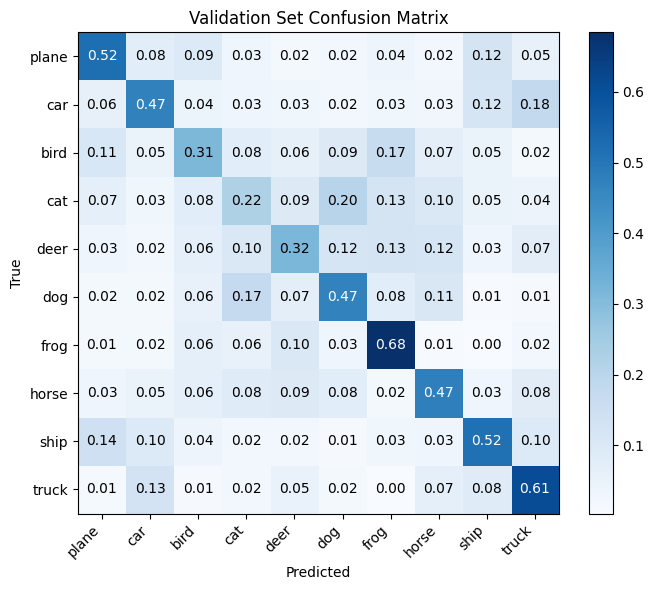

In [30]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

# 1. 先计算混淆矩阵（未归一化）
cm = confusion_matrix(test_labels, all_preds)

# 2. 对每一行（每个真实类别）做归一化，便于观察“召回率”
cm_norm = cm.astype(float) / cm.sum(axis=1)[:, np.newaxis]

# 3. 可视化
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(cm_norm, interpolation='nearest', cmap='Blues')
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

# 4. 设置坐标轴刻度和标签
# 之前定义的 CIFAR-10 类别列表
ax.set_xticks(np.arange(len(classes)))
ax.set_yticks(np.arange(len(classes)))
ax.set_xticklabels(classes, rotation=45, ha='right')
ax.set_yticklabels(classes)

# 5. 在每个单元格里写入数值
thresh = cm_norm.max() / 2.
for i in range(cm_norm.shape[0]):
    for j in range(cm_norm.shape[1]):
        val = cm_norm[i, j]
        ax.text(j, i, f"{val:.2f}",
                ha="center", va="center",
                color="white" if val > thresh else "black")

# 6. 标题和轴标签
ax.set_ylabel('True')
ax.set_xlabel('Predicted')
ax.set_title('Validation Set Confusion Matrix')

plt.tight_layout()
plt.show()

In [31]:
# class_names = testset.classes

# # 随机选 5 张图来展示
# for idx in random.sample(range(len(testset)), 5):
#     # 1) 从 testset 拿到已 Resize、ToTensor 但未 Normalize 的图
#     img_t, label = testset[idx]  
#     # Tensor [C,H,W] -> NumPy H×W×C uint8
#     img_np = (img_t.numpy().transpose(1,2,0) * 255).astype(np.uint8)

#     # 2) 提取 BoVW 特征
#     gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
#     kps  = detect_interest_points(gray, method=INTEREST_METHOD)
#     des  = compute_custom_sift_descriptor(gray, kps)
#     if des is None:
#         hist = np.zeros(N_CLUSTERS, dtype=float)
#     else:
#         hist = build_bovw(des)

#     # 3) 使用 Torch 模型进行预测
#     x = torch.from_numpy(hist.reshape(1, -1)).float().to(device)
#     model.eval()
#     with torch.no_grad():
#         out = model(x)
#         pred = out.argmax(dim=1).item()

#     # 4) 可视化：原图 + 真实/预测标签
#     plt.figure(figsize=(4,4))
#     plt.imshow(img_np)
#     plt.title(f"GT: {class_names[label]}   Pred: {class_names[pred]}")
#     plt.axis('off')
#     plt.show()

## SVM

In [19]:
# 1. 定义一个 Pipeline，把 StandardScaler 和 LinearSVC 串起来
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('svc',    LinearSVC(dual=False, max_iter=500, random_state=42, verbose=2))
])

# 2. 指定要搜索的超参数网格
param_grid = {
    'svc__C':    [1],
    'svc__tol':  [1e-4]
}

# 3. 构造 GridSearchCV：5 折交叉验证，使用所有 CPU 核心
grid = GridSearchCV(
    pipe,
    param_grid,
    cv=5,
    n_jobs=-1, # 使用所有 CPU 核心
    verbose=2, # 输出详细信息
    scoring='accuracy'
)

# 4. 在训练集上搜索最佳超参
grid.fit(train_feats, train_labels)

print("Best parameters:", grid.best_params_)
print("Best CV accuracy:", grid.best_score_)



Fitting 5 folds for each of 1 candidates, totalling 5 fits
[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear]iter  1 act 7.387e+03 pre 7.282e+03 delta 8.428e-01 f 9.600e+03 |g| 2.409e+04 CG   5
iter  1 act 7.366e+03 pre 7.266e+03 delta 8.421e-01 f 9.600e+03 |g| 2.430e+04 CG   5
iter  1 act 7.399e+03 pre 7.296e+03 delta 8.456e-01 f 9.600e+03 |g| 2.395e+04 CG   5
iter  1 act 7.372e+03 pre 7.283e+03 delta 8.464e-01 f 9.600e+03 |g| 2.416e+04 CG   6
iter  1 act 7.371e+03 pre 7.283e+03 delta 8.472e-01 f 9.600e+03 |g| 2.393e+04 CG   6
iter  2 act 2.857e+02 pre 2.276e+02 delta 8.428e-01 f 2.213e+03 |g| 3.454e+03 CG   8
iter  2 act 2.870e+02 pre 2.297e+02 delta 8.421e-01 f 2.234e+03 |g| 3.455e+03 CG   9
iter  2 act 2.850e+02 pre 2.262e+02 delta 8.456e-01 f 2.201e+03 |g| 3.391e+03 CG   8
iter  2 act 2.722e+02 pre 2.171e+02 delta 8.472e-01 f 2.229e+03 |g| 2.956e+03 CG   9
iter  2 act 2.801e+02 pre 2.222e+02 delta 8.464e-01 f 2.228e+03 |g| 3.003e+03 CG   9
iter  3 act 1.406e+02 pre 1.153e+02 

In [20]:
# 5. 用最佳模型在测试集上评估
best_model = grid.best_estimator_
test_acc = best_model.score(test_feats, test_labels)
print(f"Test accuracy with best SVM: {test_acc:.4f}")

Test accuracy with best SVM: 0.4130


In [21]:
# # --- Randomly visualize classification results on test images ---
# import matplotlib.pyplot as plt
# # CIFAR-10 类别名称
# class_names = testset.classes
# # 随机选取几张图
# for idx in random.sample(range(len(testset)), 10):
#     img_t, label = testset[idx]
#     # Tensor [C,H,W] 转为 HxWxC uint8 图像
#     img_np = (img_t.numpy().transpose(1,2,0) * 255).astype(np.uint8)
#     # 构建 BoVW 特征
#     gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
#     kps = detect_interest_points(gray, method=INTEREST_METHOD)
#     des = compute_custom_sift_descriptor(gray, kps)
#     if des is None:
#         hist = np.zeros(N_CLUSTERS, dtype=float)
#     else:
#         hist = build_bovw(des)
#     # 标准化 & 预测
#     # X = scaler.transform(hist.reshape(1, -1)) if 'scaler' in globals() else hist.reshape(1, -1)
#     pred = best_model.predict(hist.reshape(1, -1))[0]
#     # 可视化
#     plt.figure(figsize=(4,4))
#     plt.imshow(img_np)
#     plt.title(f"GT: {class_names[label]}, Pred: {class_names[pred]}")
#     plt.axis('off')
#     plt.show()

In [22]:
# # 定义 SVM 管道并开启 verbose 打印收敛信息，关闭 shrinking 提速
# svm_fast = make_pipeline(
#     StandardScaler(),
#     LinearSVC(
#         penalty='l2',
#         loss='squared_hinge',  # 改成 squared_hinge
#         dual=False,            # n_samples > n_features 时推荐 False
#         max_iter=5000,
#         tol=1e-4,
#         verbose=1
#     )
# )

# # 在 train_feats / train_labels 上训练
# svm_fast.fit(train_feats, train_labels)
# print("SVM training complete.")

In [23]:
# from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# # 1. 预测
# svm_preds = svm_fast.predict(test_feats)

# # 2. 整体准确率
# acc = accuracy_score(test_labels, svm_preds)
# print(f"SVM Test Accuracy: {acc:.4f}")

# # 3. 详细报告
# print(classification_report(test_labels, svm_preds))

# # 4. （可选）混淆矩阵
# cm = confusion_matrix(test_labels, svm_preds)
# print("Confusion Matrix:")
# print(cm)

## KNN


In [24]:
from sklearn.neighbors import KNeighborsClassifier


clf_knn = KNeighborsClassifier(n_neighbors=500, metric='euclidean', n_jobs=-1)
clf_knn.fit(train_feats, train_labels)
preds_knn = clf_knn.predict(test_feats)
acc_knn = accuracy_score(test_labels, preds_knn)
print(f"KNN Test Accuracy: {acc_knn:.4f}")

KNN Test Accuracy: 0.2920


softmax:
Test Accuracy: 0.3903
              precision    recall  f1-score   support

       plane       0.39      0.38      0.38      1000
         car       0.56      0.31      0.40      1000
        bird       0.37      0.28      0.32      1000
         cat       0.29      0.27      0.28      1000
        deer       0.30      0.35      0.32      1000
         dog       0.40      0.30      0.34      1000
        frog       0.44      0.53      0.48      1000
       horse       0.41      0.36      0.38      1000
        ship       0.37      0.52      0.43      1000
       truck       0.44      0.60      0.51      1000

    accuracy                           0.39     10000
   macro avg       0.40      0.39      0.39     10000
weighted avg       0.40      0.39      0.39     10000

svm: 0.2520

knn: 0.1010

Test Accuracy: 0.4267
              precision    recall  f1-score   support

       plane       0.40      0.37      0.38      1000
         car       0.50      0.47      0.48      1000
        bird       0.35      0.32      0.33      1000
         cat       0.31      0.23      0.26      1000
        deer       0.39      0.36      0.37      1000
         dog       0.42      0.46      0.44      1000
        frog       0.43      0.62      0.51      1000
       horse       0.51      0.40      0.45      1000
        ship       0.44      0.46      0.45      1000
       truck       0.48      0.59      0.53      1000

    accuracy                           0.43     10000
    macro avg       0.42      0.43      0.42     10000
    weighted avg       0.42      0.43      0.42     10000

svm 27.26
knn: 12.35